# Genes2Genes analysis ---- INFLARE lineages between DUO and Ileium 

In [1]:
import anndata
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import platform
from optbinning import ContinuousOptimalBinning

from genes2genes import Main
from genes2genes import VisualUtils
from genes2genes import ClusterUtils
from genes2genes import TimeSeriesPreprocessor
from genes2genes import PathwayAnalyserV2

print(platform.python_version())

3.8.18


In [73]:
aligner_v2 = aligner


In [152]:
aligner.ref_mat.shape[0] + aligner.query_mat.shape[0]

3832

In [151]:
aligner.query_mat.shape

(1824, 18362)

mean matched percentage: 
75.68 %


235       HOXB9
234       HOXB7
405     ONECUT2
232       HOXA5
419        PDX1
227      HOXA10
317       MEIS2
629      ZBTB10
26         ATF3
626       ZBED6
148        FOSB
447      PRDM16
200        HES1
279        KLF4
80      CREB3L3
117        EGR1
262         JUN
487       SATB2
300        MAFF
230       HOXA3
263        JUNB
147         FOS
277        KLF2
172       FOXQ1
1148      ZNF90
146     FLYWCH1
246        IRF1
5         AHDC1
281        KLF6
350       MYRFL
424       PITX1
202        HES4
349        MYRF
916      ZNF503
389       NR1H3
534       STAT1
254        IRF9
520       SP110
536       STAT3
702      ZNF100
169       FOXP1
123        ELF3
1000     ZNF613
1117    ZNF804A
444       PRDM1
453       PROX1
1133     ZNF841
840     ZNF354B
152       FOXA2
314       MEF2B
609        USF1
769      ZNF234
674        ZFP3
865      ZNF417
15       ARID5A
559         TEF
527       SPDEF
Name: Gene, dtype: object

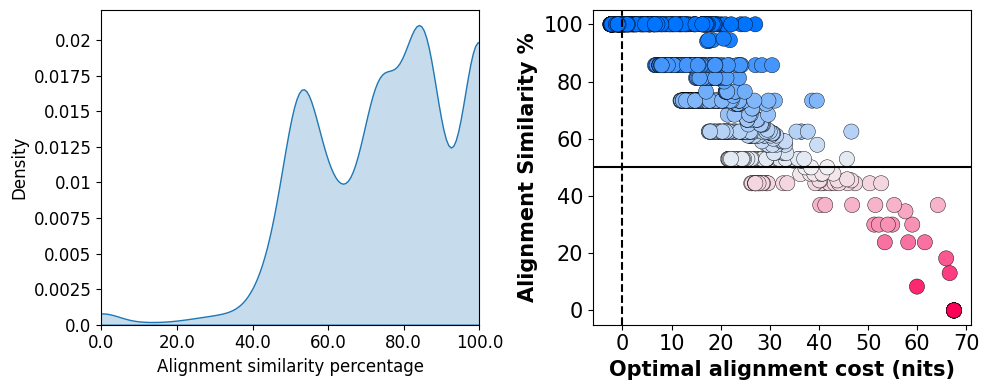

In [120]:
aligner = aligner_v2
df = aligner.get_stat_df() 
df.sort_values(['opt_alignment_cost','alignment_similarity_percentage'], ascending=[False,False])
df[np.logical_and(list(df['alignment_similarity_percentage'] <=0.5), list(df['opt_alignment_cost'] >=30)) ].Gene
topDEgenes = df[np.logical_and(list(df['alignment_similarity_percentage'] <=0.5), list(df['opt_alignment_cost'] >=30)) ].Gene
topDEgenes

In [140]:
#topDEgenes
np.intersect1d(np.intersect1d(rq2_de.Gene, rq3_de.Gene), topDEgenes) 

array(['EGR1', 'FLYWCH1', 'FOSB', 'HES1', 'HOXB9', 'JUNB', 'MAFF',
       'MYRFL', 'SPDEF', 'ZNF90'], dtype=object)

In [121]:
rq2_de = pd.read_csv('attic/RQ2_top_de_genes.csv')
rq3_de = pd.read_csv('attic/RQ3_top_de_genes.csv')

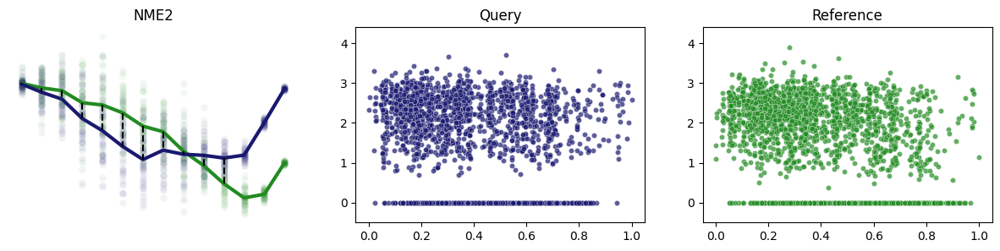

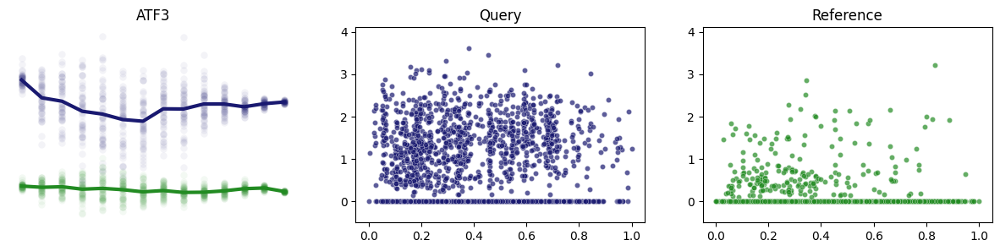

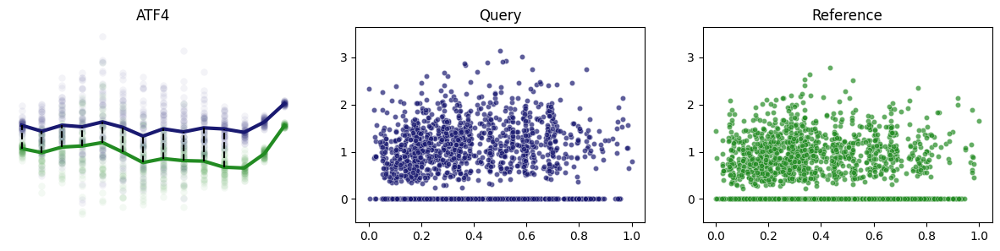

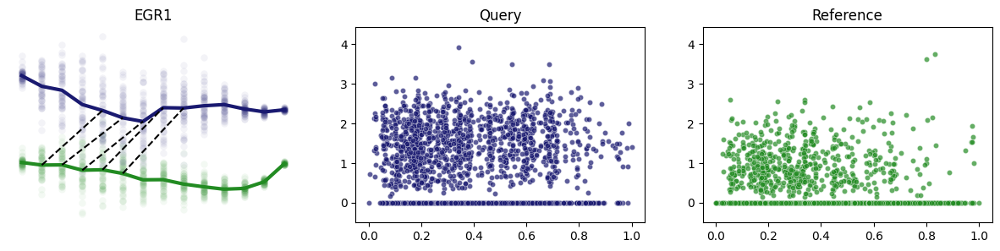

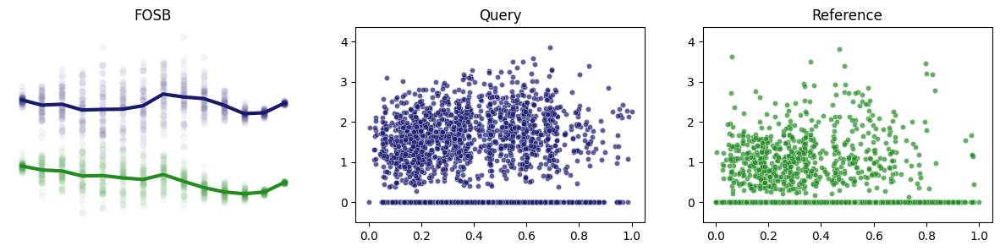

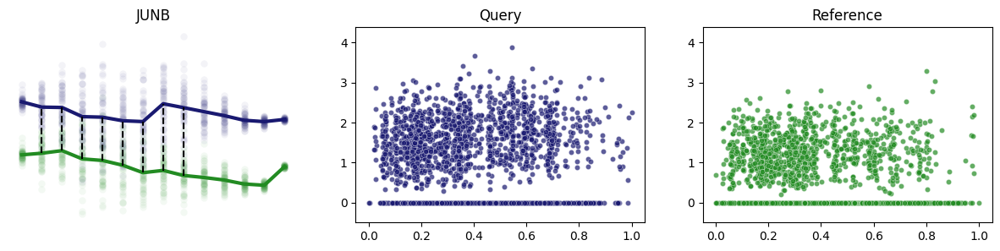

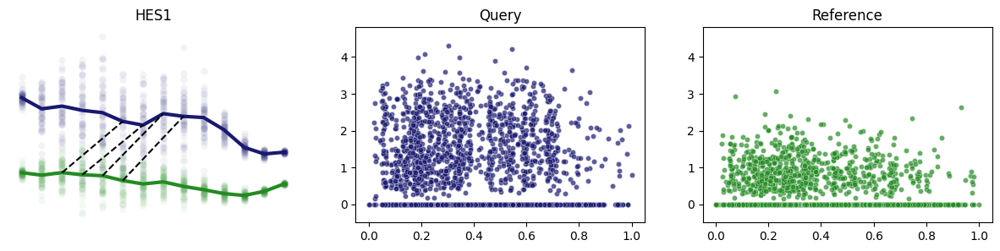

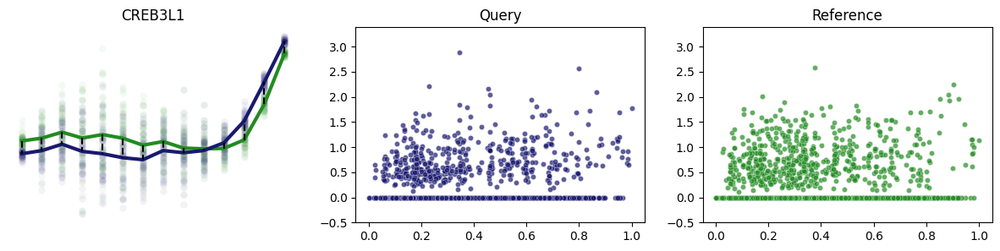

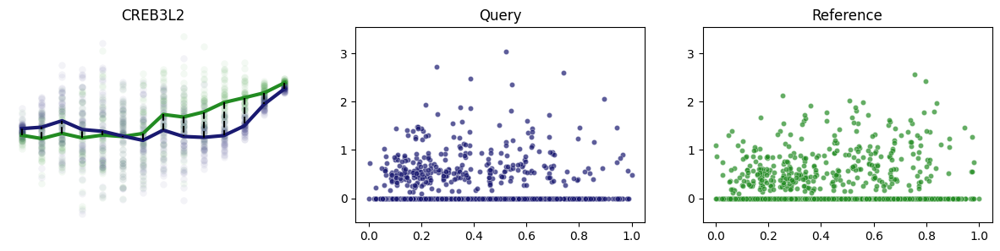

In [61]:
for g in ['NME2', 'ATF3','ATF4','EGR1','FOSB','JUNB', 'HES1',  'CREB3L1' ,'CREB3L2']:
    VisualUtils.plotTimeSeries(g, aligner)
    plt.savefig('figures/run2_w_palantir_only_healthy_disease/'+g+'_healthy_duo_vs_disease.png')

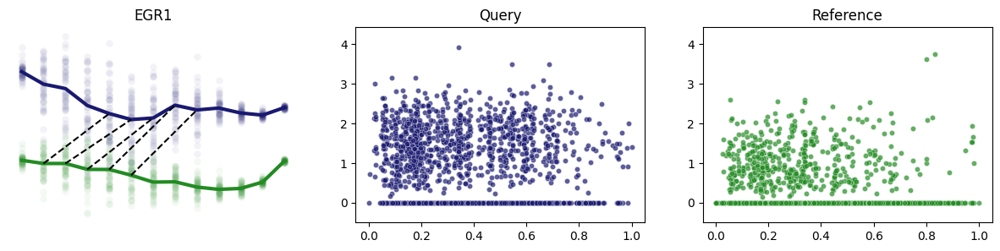

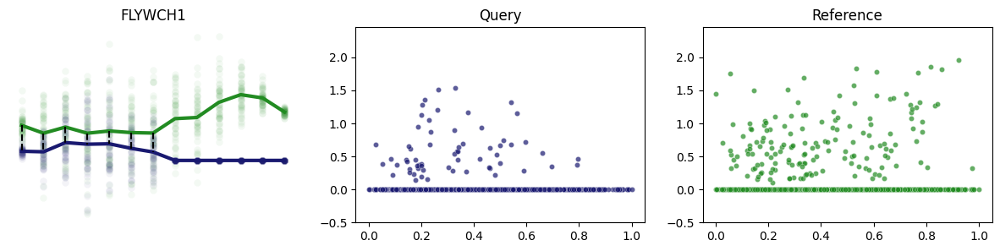

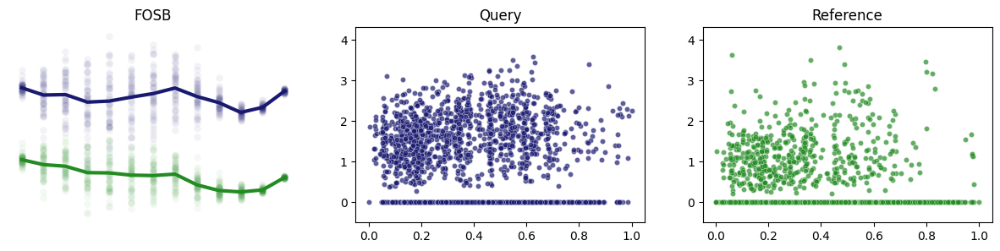

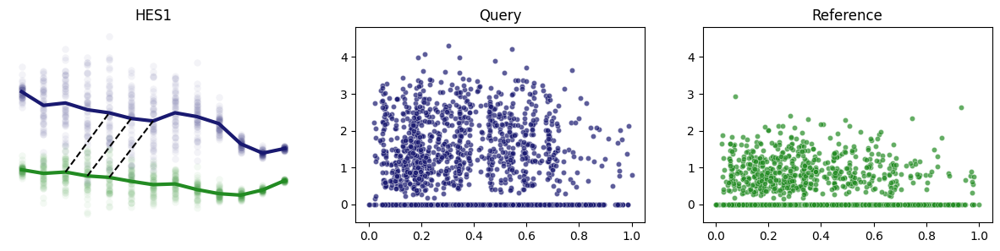

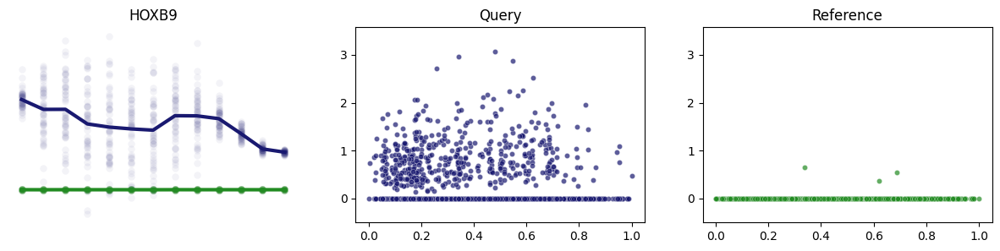

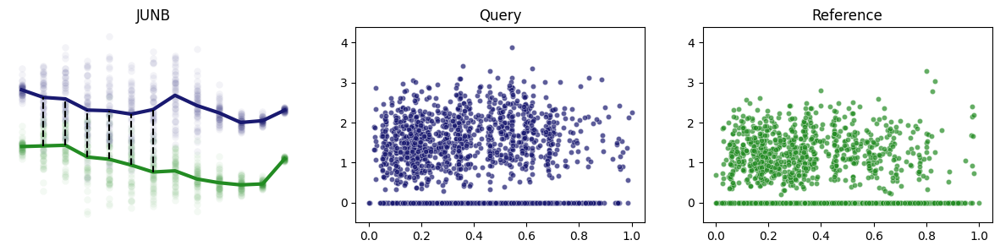

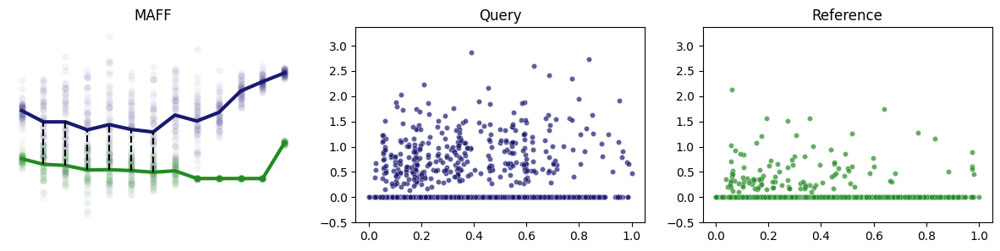

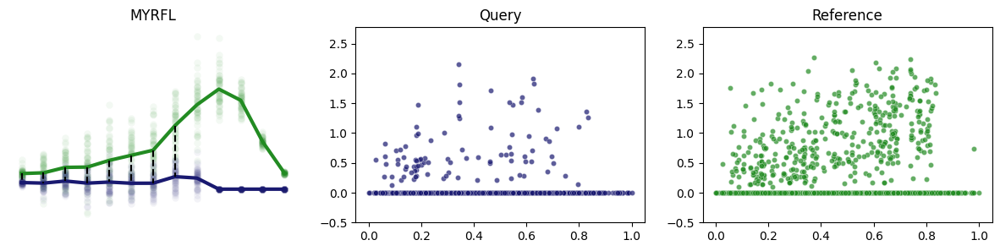

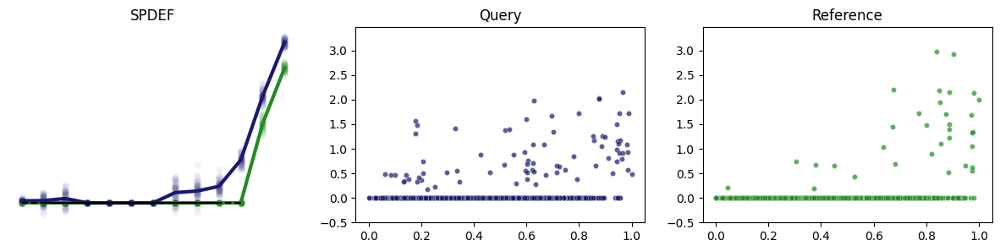

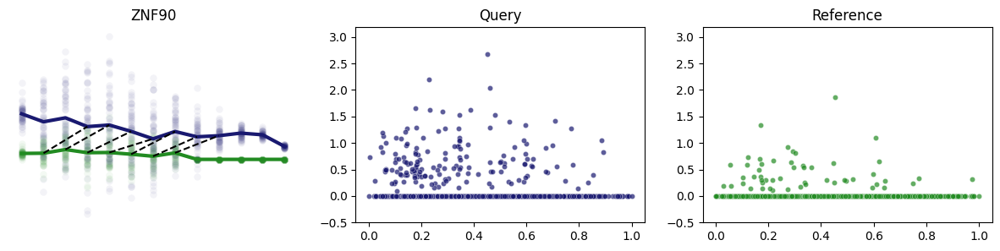

In [147]:
for g in ['EGR1', 'FLYWCH1', 'FOSB', 'HES1', 'HOXB9', 'JUNB', 'MAFF','MYRFL', 'SPDEF', 'ZNF90']:
    VisualUtils.plotTimeSeries(g, aligner)
    plt.savefig('figures/run2_w_palantir_only_healthy_disease/'+g+'_healthy_duo_vs_disease.png')

100.0

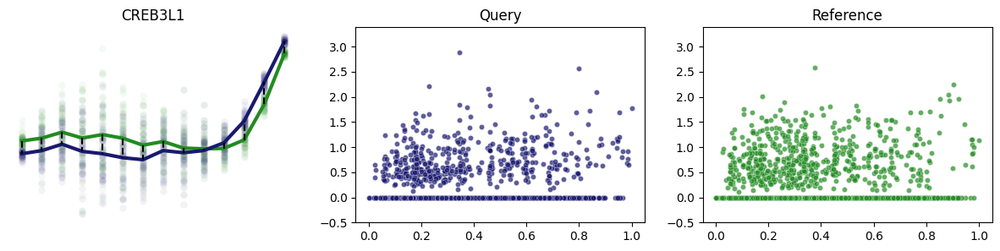

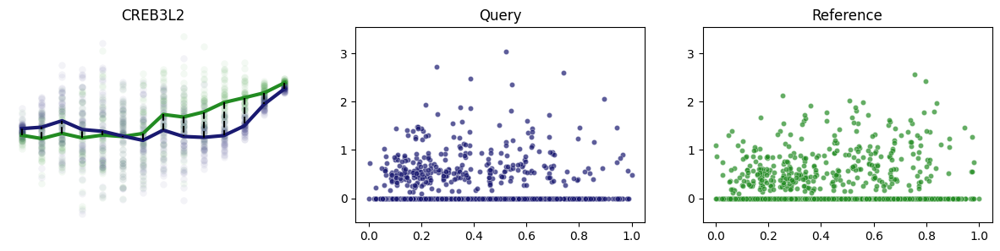

In [82]:
VisualUtils.plotTimeSeries('CREB3L1', aligner)
aligner.results_map['CREB3L1'].match_percentage
VisualUtils.plotTimeSeries('CREB3L2', aligner)
aligner.results_map['CREB3L2'].match_percentage

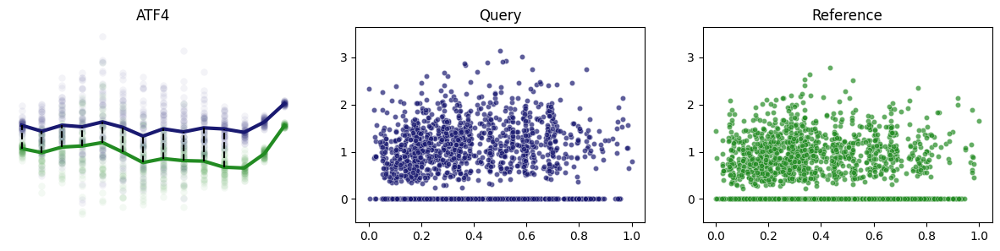

In [79]:
aligner.results_map['ATF4'].match_percentage
VisualUtils.plotTimeSeries('ATF4', aligner)

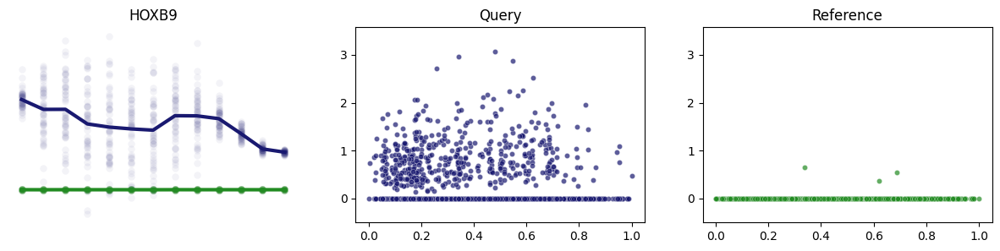

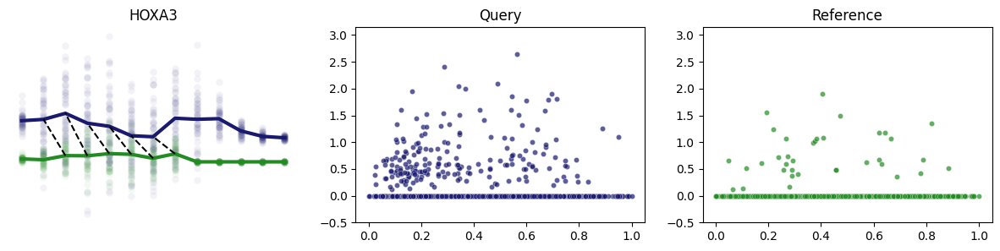

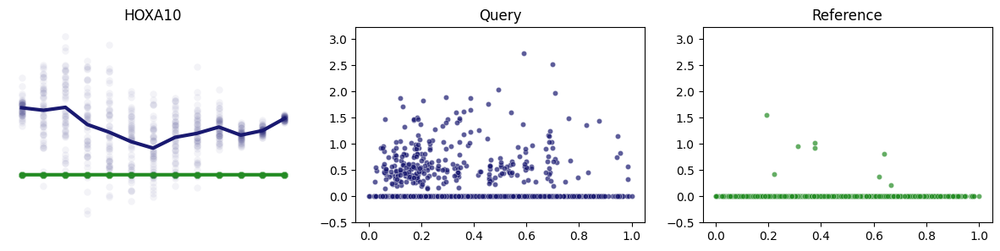

In [135]:
VisualUtils.plotTimeSeries('HOXB9', aligner)
VisualUtils.plotTimeSeries('HOXA3', aligner)
VisualUtils.plotTimeSeries('HOXA10', aligner)

In [138]:
np.array(list(topDEgenes) ) 

array(['HOXB9', 'HOXB7', 'ONECUT2', 'HOXA5', 'PDX1', 'HOXA10', 'MEIS2',
       'ZBTB10', 'ATF3', 'ZBED6', 'FOSB', 'PRDM16', 'HES1', 'KLF4',
       'CREB3L3', 'EGR1', 'JUN', 'SATB2', 'MAFF', 'HOXA3', 'JUNB', 'FOS',
       'KLF2', 'FOXQ1', 'ZNF90', 'FLYWCH1', 'IRF1', 'AHDC1', 'KLF6',
       'MYRFL', 'PITX1', 'HES4', 'MYRF', 'ZNF503', 'NR1H3', 'STAT1',
       'IRF9', 'SP110', 'STAT3', 'ZNF100', 'FOXP1', 'ELF3', 'ZNF613',
       'ZNF804A', 'PRDM1', 'PROX1', 'ZNF841', 'ZNF354B', 'FOXA2', 'MEF2B',
       'USF1', 'ZNF234', 'ZFP3', 'ZNF417', 'ARID5A', 'TEF', 'SPDEF'],
      dtype='<U7')

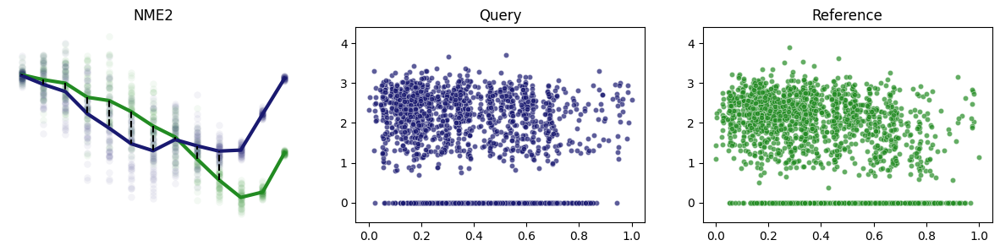

In [129]:
VisualUtils.plotTimeSeries('NME2', aligner)

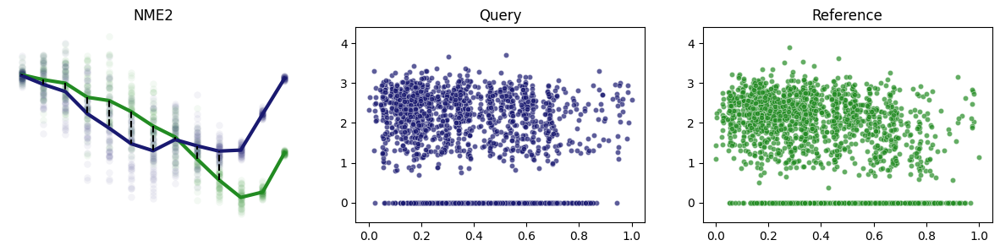

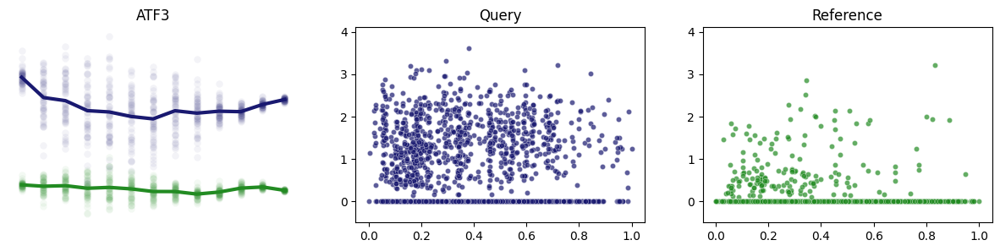

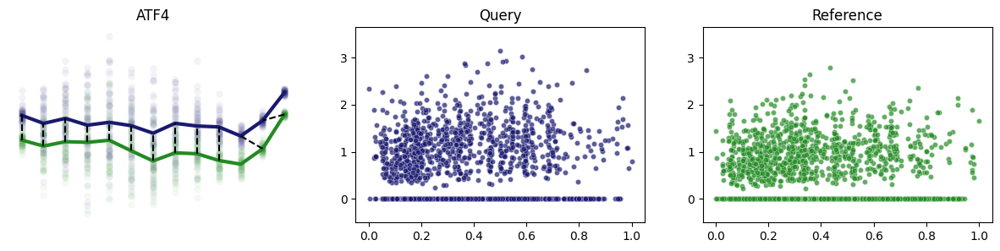

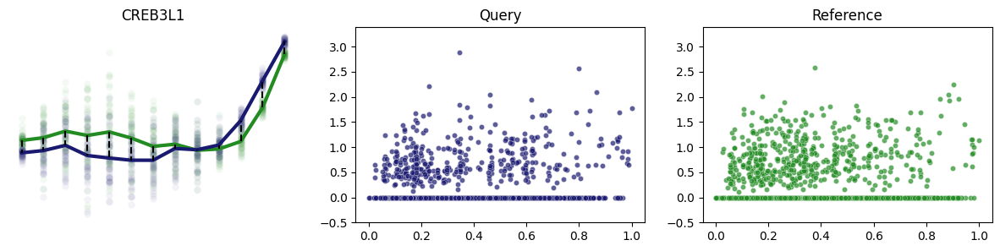

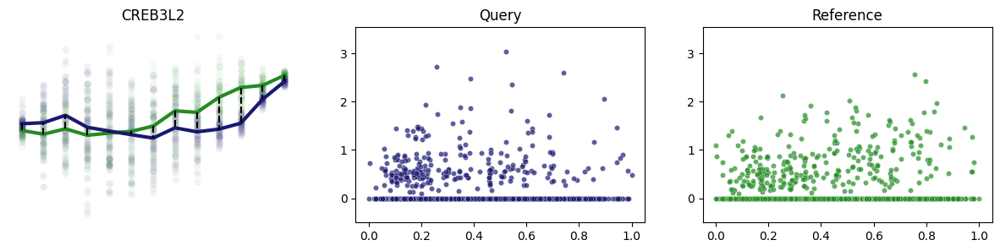

In [130]:
for g in ['NME2','ATF3','ATF4','CREB3L1','CREB3L2']:
    VisualUtils.plotTimeSeries(g, aligner)

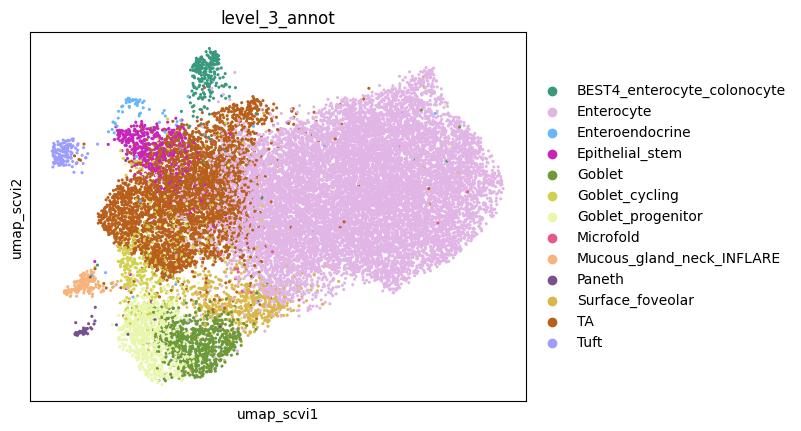

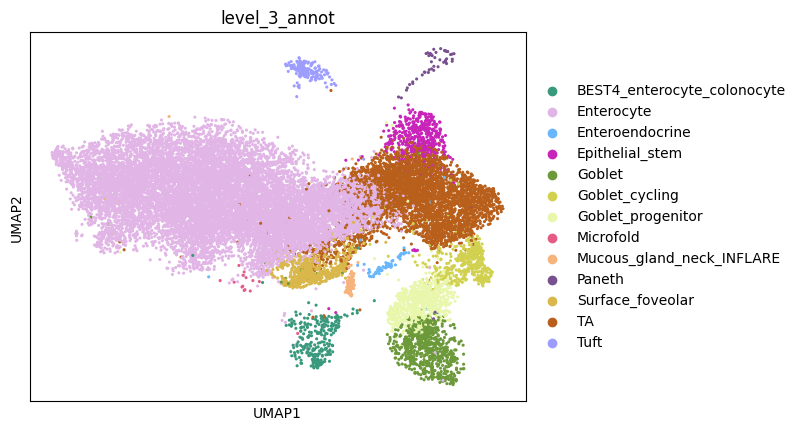

In [2]:
import pandas as pd
import scanpy as sc
adata = anndata.read_h5ad('duo_healthy_ileum_disease.h5ad')
meta = pd.read_csv('meta_subset_duo_healthy_ileum_disease.csv')
adata.obs = meta.set_index('index')
sc.pl.embedding(adata , basis='umap_scvi', color='level_3_annot', s=20 )
sc.pl.embedding(adata , basis='umap', color='level_3_annot', s=20 )

adata.obs['clusters'] = adata.obs.level_3_annot 

In [3]:
#adata_new_scvi = anndata.read_h5ad('v2_inflare_lineage_for_g2g_RQ1.h5ad')
#meta = pd.read_csv('v2_metadata_sub_inflare_lineage_for_g2g_RQ1.csv')
#adata_new_scvi.obs = meta.set_index('index')
#adata_new_scvi.shape # 3832
#adata = adata[adata_new_scvi.obs_names]

In [5]:
#adata.obsm['X_umap_scvi'] = adata_new_scvi.obsm['X_umap_scvi']

In [62]:
adata_ref

AnnData object with n_obs × n_vars = 2256 × 17763
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [63]:
adata_query

AnnData object with n_obs × n_vars = 2162 × 18884
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [6]:
adata.obs['Palantir_pseudotime']

index
ACTGCTCAGTCCAGGA-HCA_A_GT12934998-0    0.045753
CGAGCCACAGTCTTCC-HCA_A_GT12934998-0    0.025838
AACACGTCAAGTCTAC-Pan_T7917827-0        0.346181
AACTCAGTCTGTGCAA-Pan_T7917827-0        0.254254
AACTCTTCAGGAATCG-Pan_T7917827-0        0.420568
                                         ...   
GCTGGGTTCAAAGTAG-GSM3972030-1          0.183550
GTATCTTAGCCAGGAT-GSM3972030-1          0.380497
GTCGTAAAGACTCGGA-GSM3972030-1          0.489857
GTGGGTCGTCGGATCC-GSM3972030-1          0.116402
TTCTACATCGTACGGC-GSM3972030-1          0.118581
Name: Palantir_pseudotime, Length: 20765, dtype: float64

In [8]:
#adata_new_scvi.obs['Palantir_pseudotime']

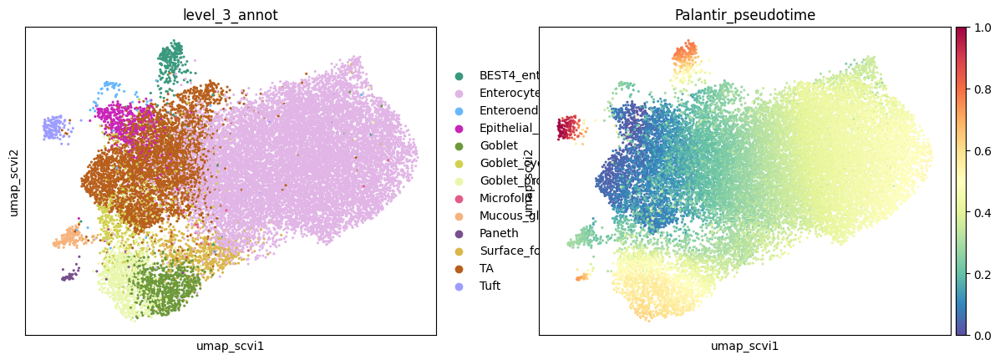

In [10]:
sc.pl.embedding(adata , basis='umap_scvi', color=['level_3_annot','Palantir_pseudotime'], s=20, cmap='Spectral_r' )
#sc.pl.embedding(adata_new_scvi , basis='umap_scvi', color=['level_3_annot','Palantir_pseudotime'], s=20, cmap='Spectral_r' )

In [11]:
adata_ref = adata[adata.obs.ID=='HEALTHY']
adata_query = adata[adata.obs.ID=='DISEASE']

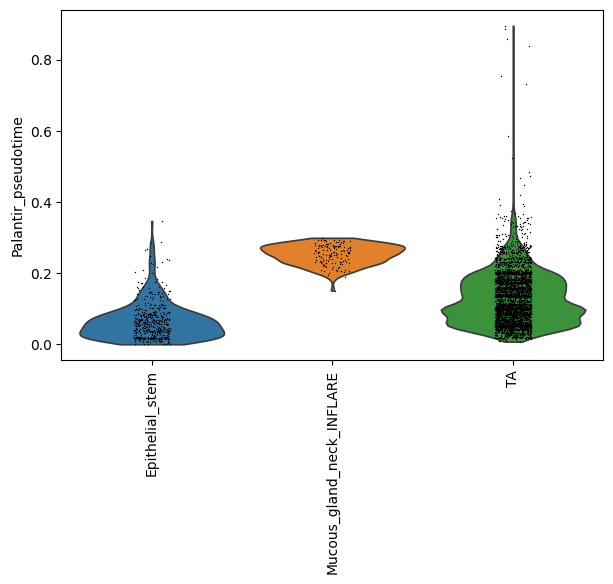

In [12]:
inflare_cells = adata[adata.obs.level_3_annot == 'Mucous_gland_neck_INFLARE']
TA_cells = adata[adata.obs.level_3_annot == 'TA']
#TA_cells = TA_cells[TA_cells.obs['Palantir_pseudotime']< np.mean(inflare_cells.obs.Palantir_pseudotime)] # because there seems to be a considerable number of TA cells having pseudotime more than INFLARE cells
epi_cells = adata[adata.obs.level_3_annot == 'Epithelial_stem']
#epi_cells = epi_cells[epi_cells.obs['Palantir_pseudotime']< np.mean(inflare_cells.obs.Palantir_pseudotime)]

temp = adata[list(TA_cells.obs_names) + list(epi_cells.obs_names) + list(inflare_cells.obs_names)] 

sc.pl.violin(temp, keys=["Palantir_pseudotime"], groupby="clusters", rotation=90)

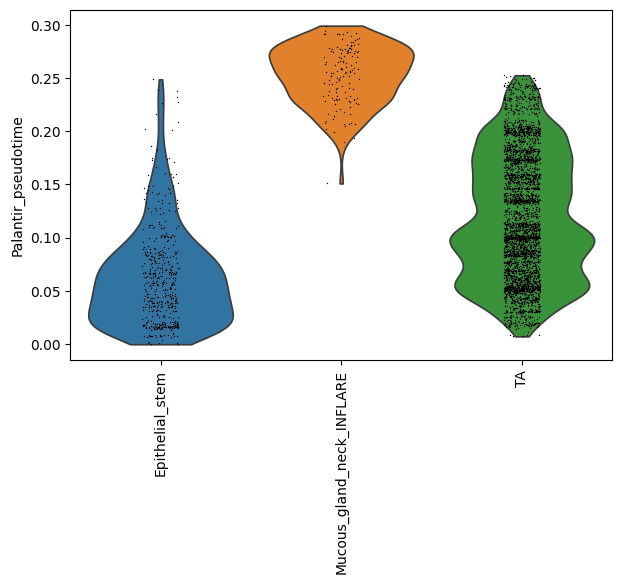

In [64]:
inflare_cells = adata[adata.obs.level_3_annot == 'Mucous_gland_neck_INFLARE']
TA_cells = adata[adata.obs.level_3_annot == 'TA']
TA_cells = TA_cells[TA_cells.obs['Palantir_pseudotime']< np.mean(inflare_cells.obs.Palantir_pseudotime)] # because there seems to be a considerable number of TA cells having pseudotime more than INFLARE cells
epi_cells = adata[adata.obs.level_3_annot == 'Epithelial_stem']
epi_cells = epi_cells[epi_cells.obs['Palantir_pseudotime']< np.mean(inflare_cells.obs.Palantir_pseudotime)]

lof_adata = adata[list(TA_cells.obs_names) + list(epi_cells.obs_names) + list(inflare_cells.obs_names)] 

sc.pl.violin(lof_adata, keys=["Palantir_pseudotime"], groupby="clusters", rotation=90)

In [66]:
lof_adata[lof_adata.obs.ID=='HEALTHY'].shape
lof_adata[lof_adata.obs.ID=='DISEASE'].shape

(2162, 36601)

In [14]:
adata_ref = lof_adata[lof_adata.obs.ID=='HEALTHY']
adata_query = lof_adata[lof_adata.obs.ID=='DISEASE']

In [15]:
print(adata_ref.shape)
print(adata_query.shape)

(2256, 36601)
(2162, 36601)


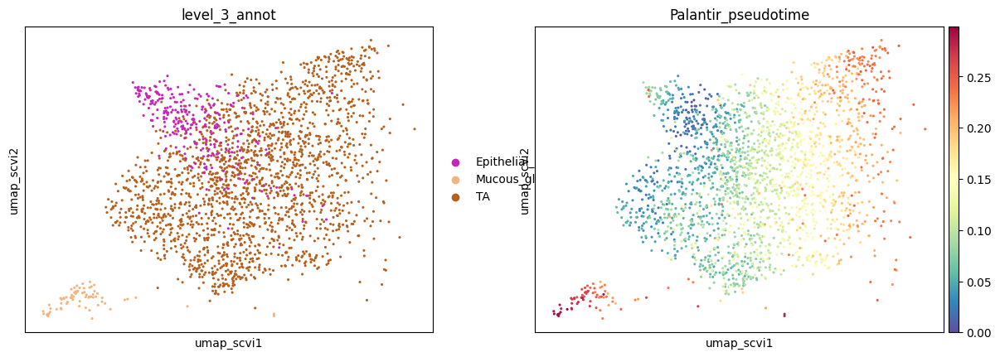

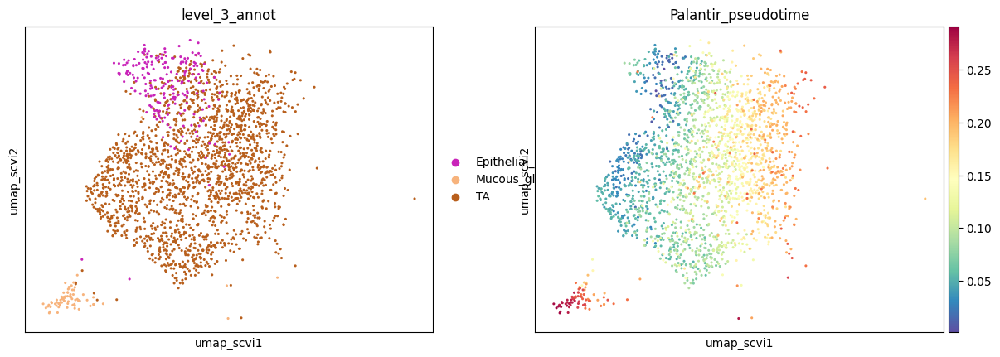

In [16]:
sc.pl.embedding(adata_ref , basis='umap_scvi', color=['level_3_annot','Palantir_pseudotime'], s=20, cmap='Spectral_r' )
sc.pl.embedding(adata_query , basis='umap_scvi', color=['level_3_annot','Palantir_pseudotime'], s=20, cmap='Spectral_r' )

In [51]:
#adata_ref = adata_ref[[c in ['TA','Epithelial_stem','Mucous_gland_neck_INFLARE']for c in adata_ref.obs.level_3_annot]]
#adata_query = adata_query[[c in ['TA','Epithelial_stem','Mucous_gland_neck_INFLARE']for c in adata_query.obs.level_3_annot]]

In [17]:
adata_ref.obs['time'] = adata_ref.obs['Palantir_pseudotime']
adata_query.obs['time'] = adata_query.obs['Palantir_pseudotime']

In [18]:


# check the current range
print(min(adata_ref.obs['time']), max(adata_ref.obs['time']))
print(min(adata_query.obs['time']), max(adata_query.obs['time']))

0.0 0.2991462749150012
0.0008829463293142 0.2912955716801222


In [19]:
# if it does not follow [0,1] range, run below
adata_ref.obs['time'] = TimeSeriesPreprocessor.Utils.minmax_normalise(np.asarray(adata_ref.obs['time']))
adata_query.obs['time'] = TimeSeriesPreprocessor.Utils.minmax_normalise(np.asarray(adata_query.obs['time']))


In [20]:


# check the current range
print(min(adata_ref.obs['time']), max(adata_ref.obs['time']))
print(min(adata_query.obs['time']), max(adata_query.obs['time']))

0.0 1.0
0.0 1.0


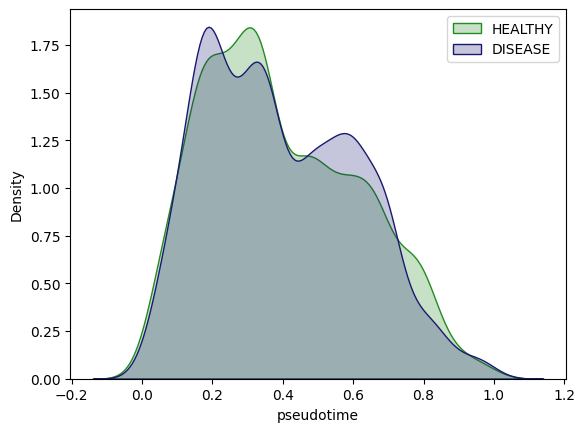

In [59]:
sb.kdeplot(adata_ref.obs['time'], fill=True, label='HEALTHY', color='forestgreen') 
sb.kdeplot(adata_query.obs['time'], fill=True, label='DISEASE', color='midnightblue'); 
plt.xlabel('pseudotime'); plt.legend(); 
plt.savefig('figures/run2_w_palantir_only_healthy_disease/healthy_duo_vs_disease_psuedotime_cell_density_plot.pdf')

In [22]:
#sb.kdeplot(adata_ref.obs['time'], fill=True, label='HEALTHY', color='forestgreen') 
#sb.kdeplot(adata_query.obs['time'], fill=True, label='DISEASE', color='midnightblue'); 
#plt.xlabel('pseudotime'); plt.legend(); 
#plt.savefig('attic/figures/healthy_duo_vs_disease_psuedotime_cell_density_plot.pdf')

In [23]:
adata_ref

AnnData object with n_obs × n_vars = 2256 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [24]:
adata_query

AnnData object with n_obs × n_vars = 2162 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [26]:
x = np.asarray(adata_ref.obs.time)
optb = ContinuousOptimalBinning(name='pseudotime', dtype="numerical")
optb.fit(x, x)
print(len(optb.splits))

x = np.asarray(adata_query.obs.time)
optb = ContinuousOptimalBinning(name='pseudotime', dtype="numerical")
optb.fit(x, x)
print(len(optb.splits))

13
14


In [27]:
our_cmap = {}
our_palette = adata.uns['level_3_annot_colors']
i = 0 
for c in np.unique(adata.obs['level_3_annot']) :
    our_cmap[c] = our_palette[i]
    i+=1

# trying max n points for optimal binning = 14
Optimal equal number of bins for R and Q =  14


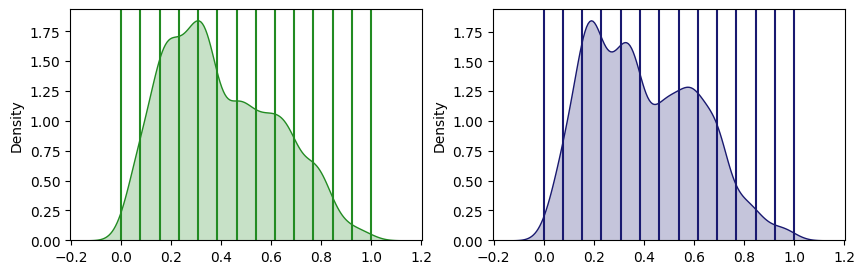

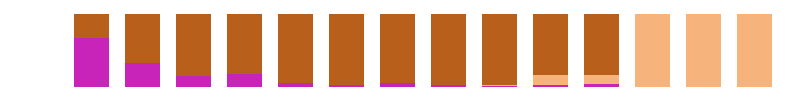

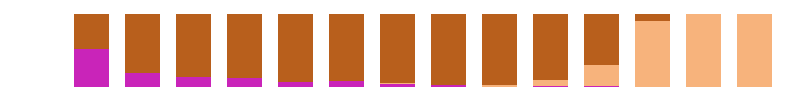

In [28]:

vs = VisualUtils.VisualUtils.get_celltype_composition_across_time(adata_ref, adata_query, n_points=14, 
                                     ANNOTATION_COLNAME='level_3_annot', optimal_binning=False, ref_cmap=our_cmap, query_cmap=our_cmap)

In [29]:

#vs = VisualUtils.VisualUtils.get_celltype_composition_across_time(adata_ref, adata_query, n_points=13, 
#                                     ANNOTATION_COLNAME='level_3_annot', optimal_binning=False, ref_cmap=our_cmap, query_cmap=our_cmap)

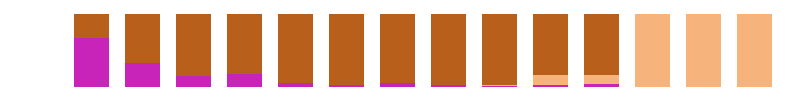

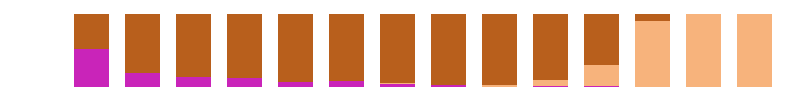

In [58]:
        ref_cmap = our_cmap
        query_cmap = our_cmap
        vs.metaS.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=ref_cmap, grid = False, legend=False, width=0.7,align='edge',figsize=(10,1))
        plt.axis('off')
        plt.savefig('figures/run2_w_palantir_only_healthy_disease/G2G_celltype_composition_query_RQ1_healthy.pdf')
        vs.metaT.apply(lambda x: x*100/sum(x), axis=1).plot(kind='bar',stacked=True,color=query_cmap, grid = False, legend=False, width=0.7,align='edge',figsize=(10,1))
        plt.axis('off')
        plt.savefig('figures/run2_w_palantir_only_healthy_disease/G2G_celltype_composition_query_RQ1_disease.pdf')

In [32]:
print(adata_ref.X.data)
adata_query.X.data

[  2.   1.   2. ...  30. 137.   1.]


array([  1.,   1.,   9., ..., 107.,   9.,  57.], dtype=float32)

In [33]:
sc.pp.filter_genes(adata_ref, min_cells=3)
sc.pp.normalize_per_cell(adata_ref, 10000) 
sc.pp.log1p(adata_ref)
sc.pp.filter_genes(adata_query, min_cells=3)
sc.pp.normalize_per_cell(adata_query, 10000) 
sc.pp.log1p(adata_query)

In [34]:
def get_human_TF_list(): 
    # get a human TF list 
    TF_list = pd.read_csv('../../[A]G2G_Latest/huamn_TF_list.csv',skiprows=1)
    np.unique(TF_list['Unnamed: 3'], return_counts=True) # There are only 1639 true TFs out of 2765 TFs in this list 
    TF_list = TF_list[TF_list['Unnamed: 3']=='Yes']
    TF_list['Name']
    return TF_list
human_TFs = get_human_TF_list()
common_genes = np.intersect1d(adata_ref.var_names, adata_query.var_names)
human_TFs = np.intersect1d(common_genes , np.asarray(human_TFs['Name']) )

In [37]:
gene_list = human_TFs
print(len(gene_list))

1187


In [36]:
gene_list = ['ATF4','NME2','ATF3','CREB3L2','CREB3L1']

In [38]:
aligner = Main.RefQueryAligner(adata_ref, adata_query, gene_list, 14)
aligner.WEIGHT_BY_CELL_DENSITY = True
aligner.WINDOW_SIZE=0.1
aligner.state_params = [0.99,0.1,0.7]
aligner.optimal_binning = True
aligner.opt_binning_S = vs.optimal_bining_S
aligner.opt_binning_T = vs.optimal_bining_T
aligner.align_all_pairs() 

WINDOW_SIZE= 0.1


  0%|          | 0/1187 [00:00<?, ?it/s]

Average Alignment:  MMMMMMMMMMMMIIDD


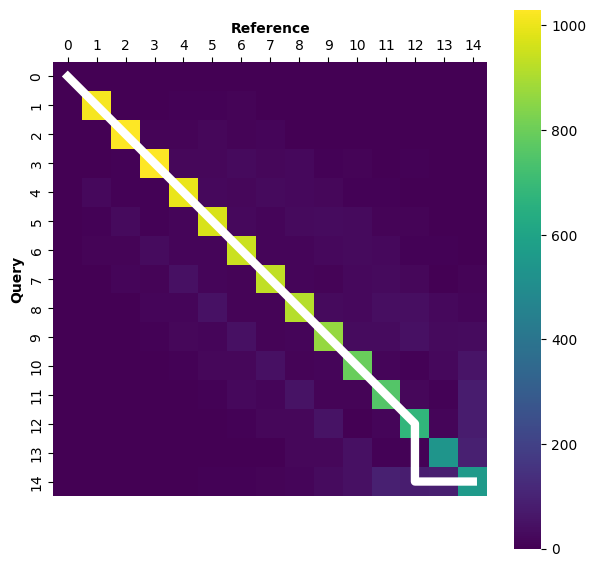

In [56]:
aligner.get_aggregate_alignment()

mean matched percentage: 
77.25 %


242       HOXB9
178       GATA4
241       HOXB7
413     ONECUT2
427        PDX1
         ...   
540       SPDEF
1135      ZNF81
452       PRDM1
461       PROX1
719      ZNF112
Name: Gene, Length: 67, dtype: object

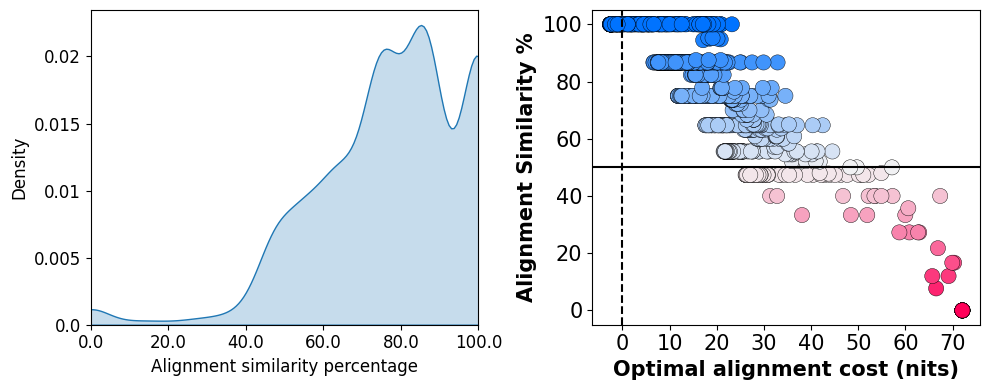

In [41]:

df = aligner.get_stat_df() 
df.sort_values(['opt_alignment_cost','alignment_similarity_percentage'], ascending=[False,False])
df[np.logical_and(list(df['alignment_similarity_percentage'] <=0.5), list(df['opt_alignment_cost'] >=30)) ].Gene
topDEgenes = df[np.logical_and(list(df['alignment_similarity_percentage'] <=0.5), list(df['opt_alignment_cost'] >=30)) ].Gene
topDEgenes



In [43]:
rq2_de = pd.read_csv('RQ2_top_de_genes.csv')
rq3_de = pd.read_csv('RQ3_top_de_genes.csv')
#topDEgenes
k = np.intersect1d(np.intersect1d(rq2_de.Gene, rq3_de.Gene), topDEgenes) 

In [70]:
'ATF3' in rq2_de

False

In [74]:
aligner.results_map['ATF3'].match_percentage

0.0

In [69]:
np.intersect1d(k,['EGR1', 'FLYWCH1', 'FOSB', 'HES1', 'HOXB9', 'JUNB', 'MAFF',
       'MYRFL', 'SPDEF', 'ZNF90'])

array(['EGR1', 'FLYWCH1', 'FOSB', 'HES1', 'HOXB9', 'JUNB', 'MAFF',
       'MYRFL', 'SPDEF', 'ZNF90'], dtype=object)

In [67]:
temp

array(['DACH1', 'ETS1', 'NR4A1', 'PITX2', 'PLAGL1', 'ZFPM1', 'ZNF236',
       'ZNF629', 'ZNF814'], dtype=object)

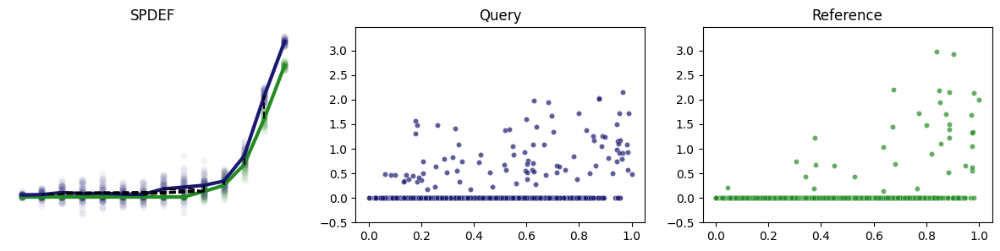

In [76]:
for g in ['SPDEF']:
        VisualUtils.plotTimeSeries(g, aligner)
        print(aligner.results_map[g].match_percentage)
        plt.savefig('figures/run2_w_palantir_only_healthy_disease/'+g+'_healthy_duo_vs_inflare_disease.png')

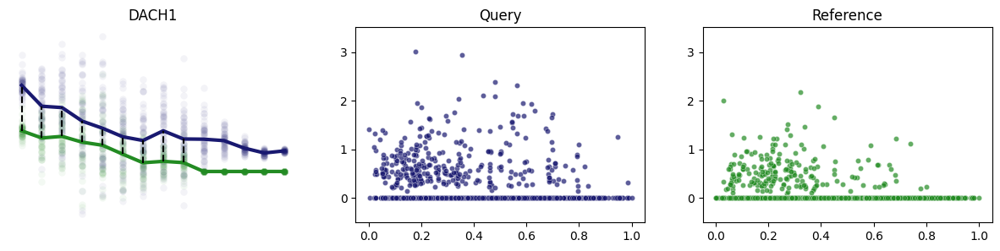

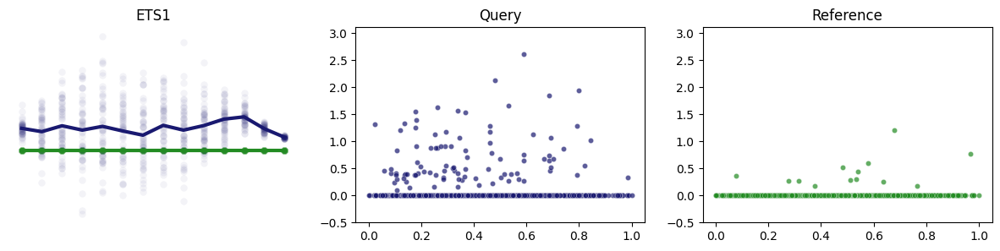

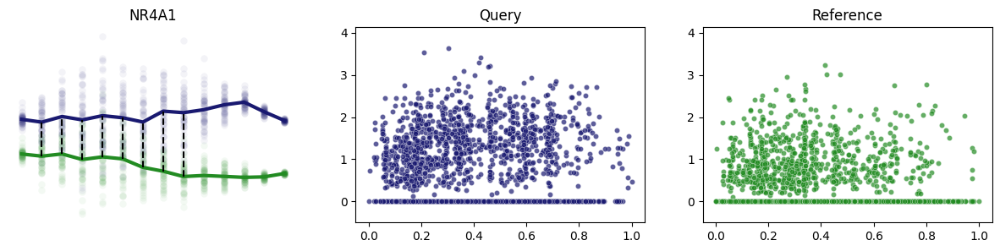

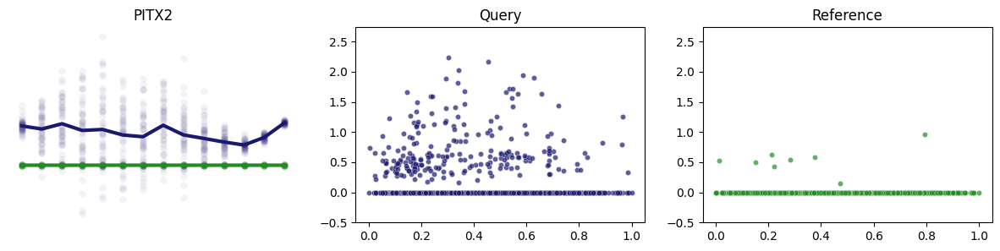

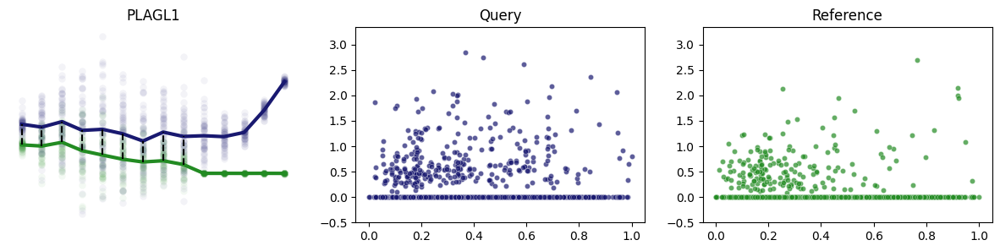

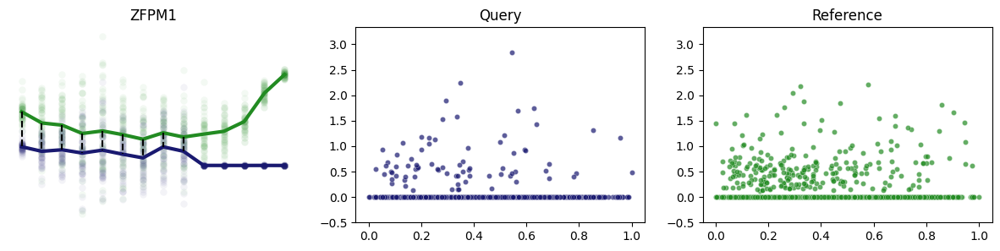

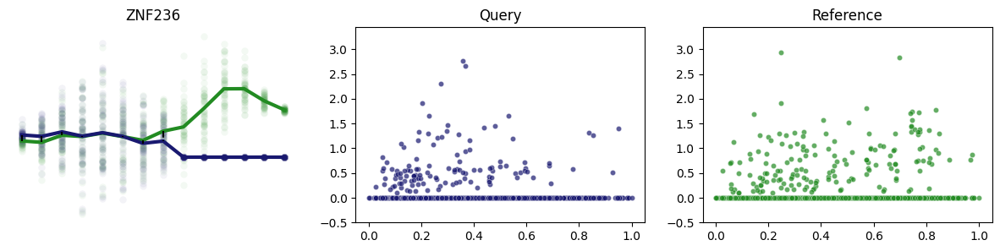

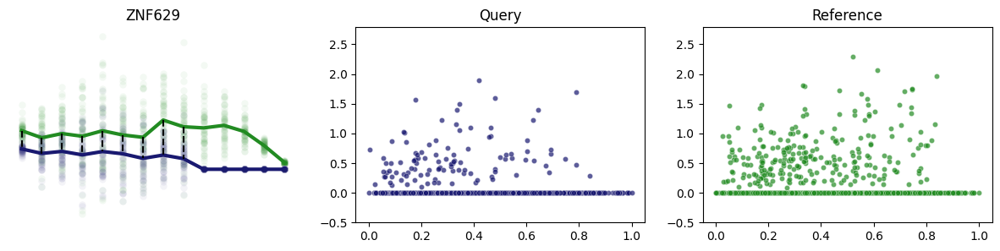

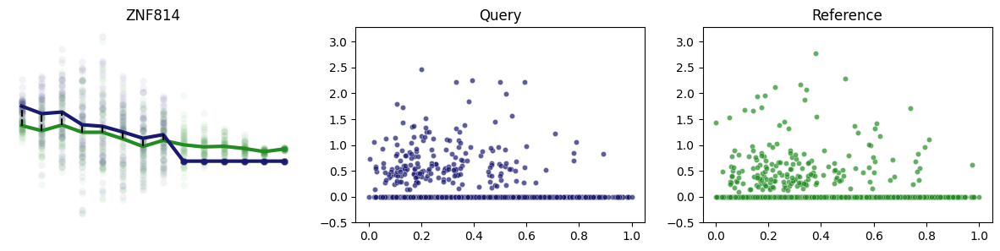

In [54]:
temp = np.setdiff1d(k,['EGR1', 'FLYWCH1', 'FOSB', 'HES1', 'HOXB9', 'JUNB', 'MAFF',
       'MYRFL', 'SPDEF', 'ZNF90'])

for g in temp:
    VisualUtils.plotTimeSeries(g, aligner)
    plt.savefig('figures/run2_w_palantir_only_healthy_disease/'+g+'_healthy_duo_vs_inflare_disease.png')

In [50]:
topDEgenes[0:10]

242      HOXB9
178      GATA4
241      HOXB7
413    ONECUT2
427       PDX1
238      HOXA5
233     HOXA10
433      PITX2
240      HOXB2
120       EGR2
Name: Gene, dtype: object

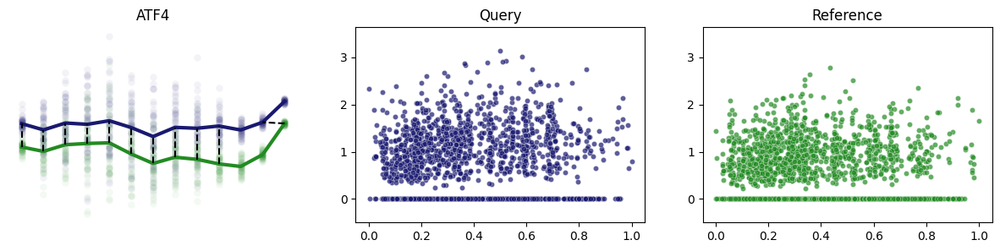

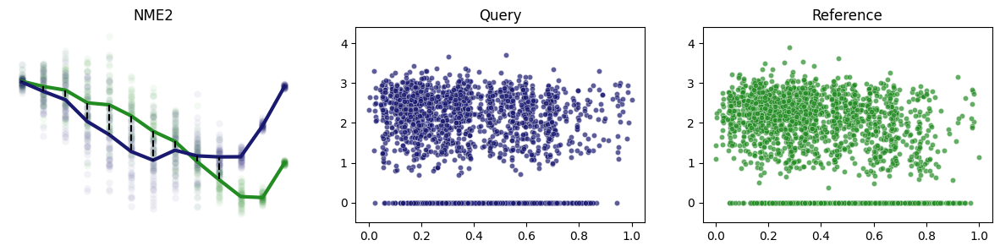

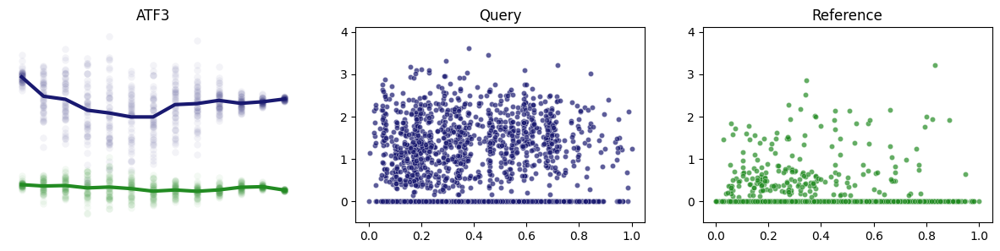

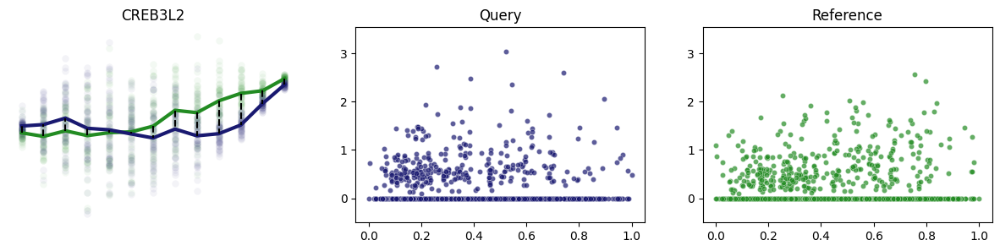

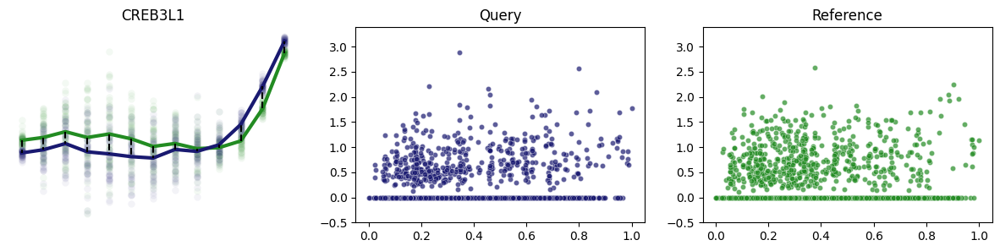

In [43]:
for g in gene_list:
    VisualUtils.plotTimeSeries(g, aligner)

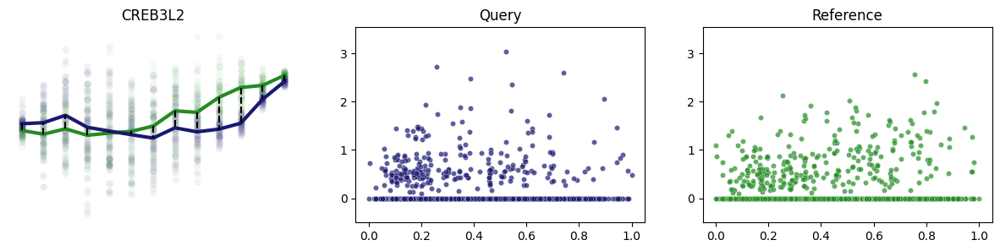

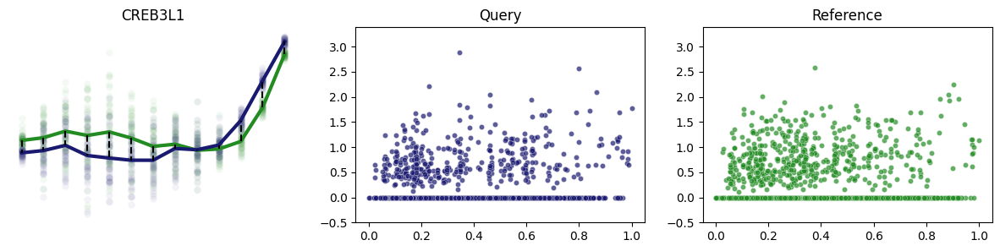

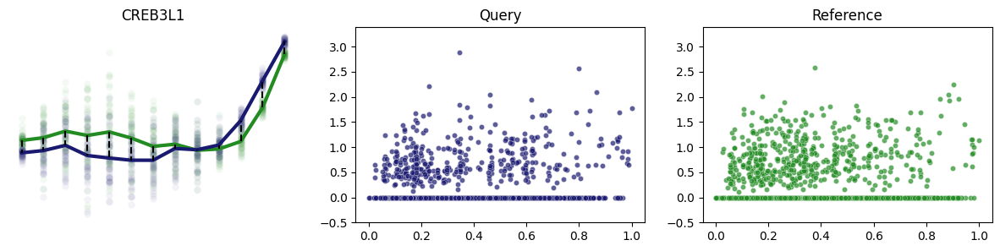

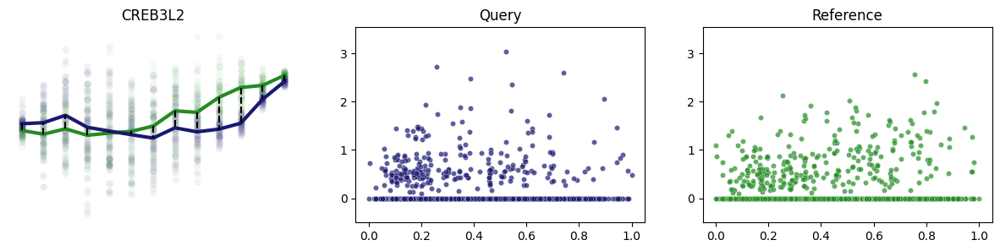

In [31]:
VisualUtils.plotTimeSeries('CREB3L2', aligner)
VisualUtils.plotTimeSeries('CREB3L1', aligner)

for g in ['CREB3L1','CREB3L2']:
    VisualUtils.plotTimeSeries(g, aligner)
    plt.savefig('figures/'+g+'_healthy_duo_vs_inflare_disease.png')

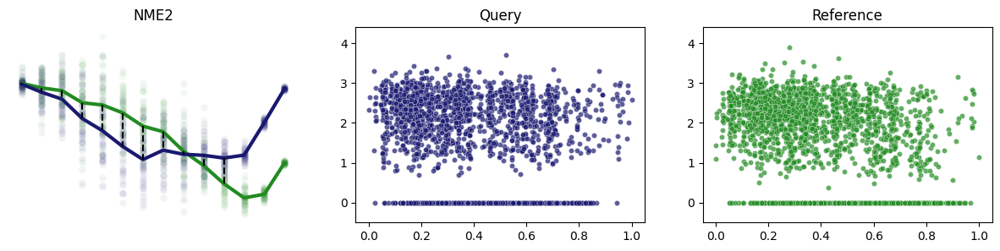

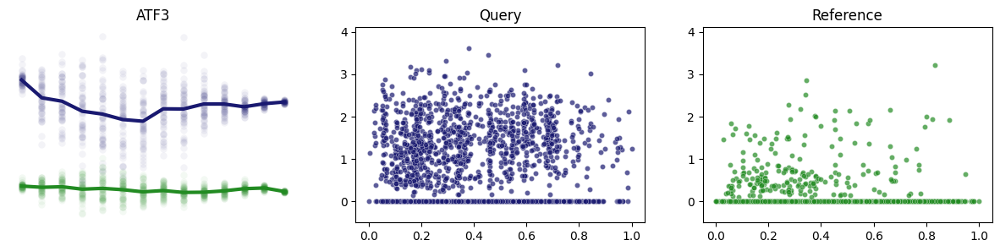

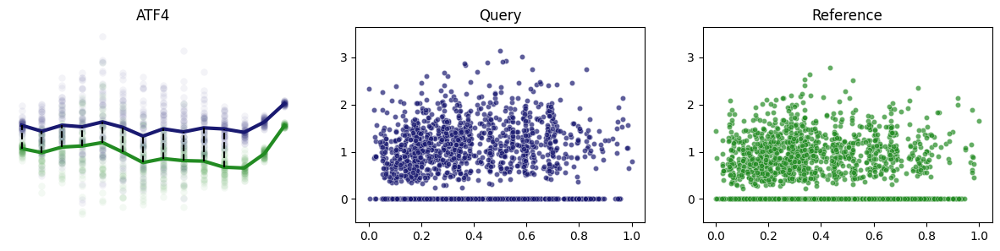

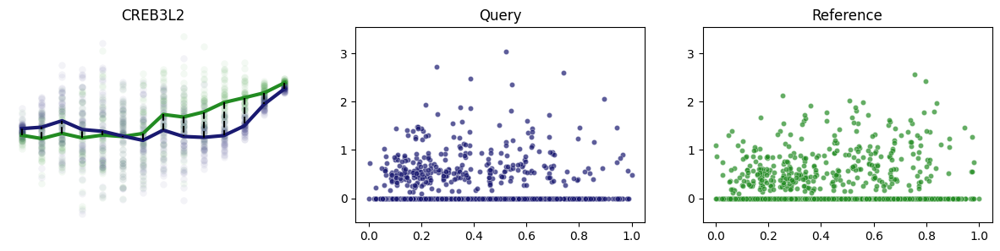

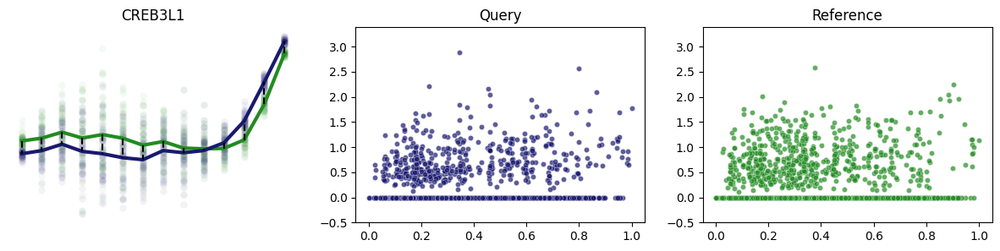

In [105]:
VisualUtils.plotTimeSeries('NME2', aligner)
VisualUtils.plotTimeSeries('ATF3', aligner)
VisualUtils.plotTimeSeries('ATF4', aligner)
VisualUtils.plotTimeSeries('CREB3L2', aligner)
VisualUtils.plotTimeSeries('CREB3L1', aligner)

In [38]:
aligner = Main.RefQueryAligner(adata_ref, adata_query, gene_list, 13)
aligner.WEIGHT_BY_CELL_DENSITY = True
aligner.WINDOW_SIZE=0.1
aligner.state_params = [0.99,0.1,0.7]
aligner.optimal_binning = True
aligner.opt_binning_S = vs.optimal_bining_S
aligner.opt_binning_T = vs.optimal_bining_T
aligner.align_all_pairs() 

WINDOW_SIZE= 0.1


  0%|          | 0/1171 [00:00<?, ?it/s]

Average Alignment:  MMMMMMMMMMIVDIDD


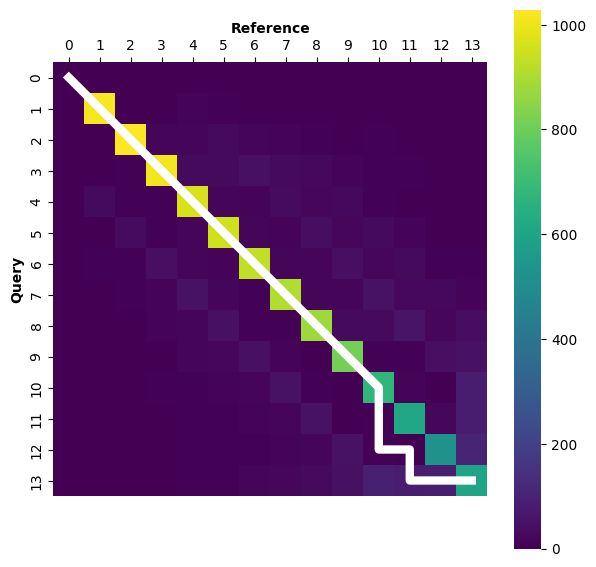

In [39]:
aligner.get_aggregate_alignment()

Average Alignment:  MMMMMMMMMMMMIIDD
Average Alignment:  MMMMMMMMMMMMIIDD


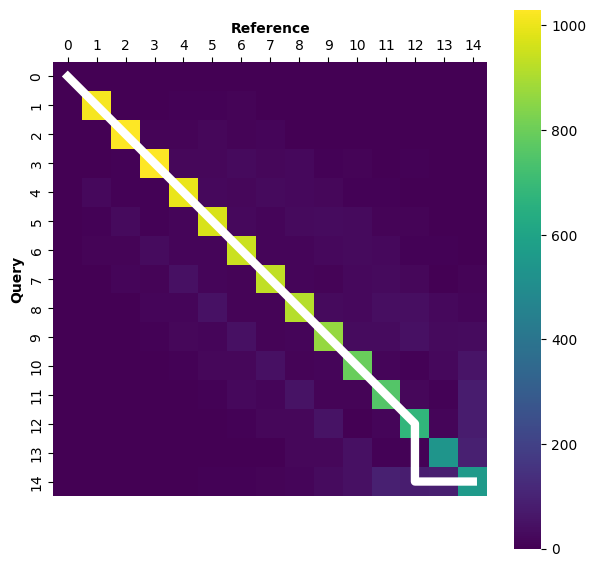

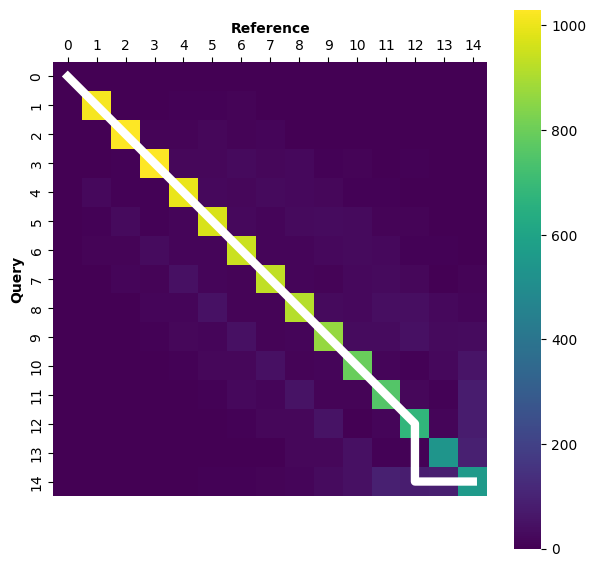

In [57]:
aligner.get_aggregate_alignment()


        
def plot_alignment_path_on_given_matrix(mat, paths, cmap='viridis'):
        fig,ax = plt.subplots(1,1, figsize=(7,7))
        sb.heatmap(mat, square=True,  cmap='viridis', ax=ax, cbar=True)  
        for path in paths: 
            path_x = [p[0]+0.5 for p in path]
            path_y = [p[1]+0.5 for p in path]
            ax.plot(path_y, path_x, color='white', linewidth=6)
        plt.xlabel("Reference",fontweight='bold')
        plt.ylabel("Query",fontweight='bold')
        ax.xaxis.tick_top() # x axis on top
        ax.xaxis.set_label_position('top')
        plt.savefig('figures/run2_w_palantir_only_healthy_disease/G2G_average_alignment_TFs_RQ1.pdf')
        
average_alignment, alignment_path =  ClusterUtils.get_cluster_average_alignments(aligner, aligner.gene_list)
mat = ClusterUtils.get_pairwise_match_count_mat(aligner, aligner.gene_list )
print('Average Alignment: ', average_alignment)
plot_alignment_path_on_given_matrix(paths = [alignment_path], mat=mat)

Average Alignment:  MMMMMMMMMMIVDIDD
Average Alignment:  MMMMMMMMMMIVDIDD


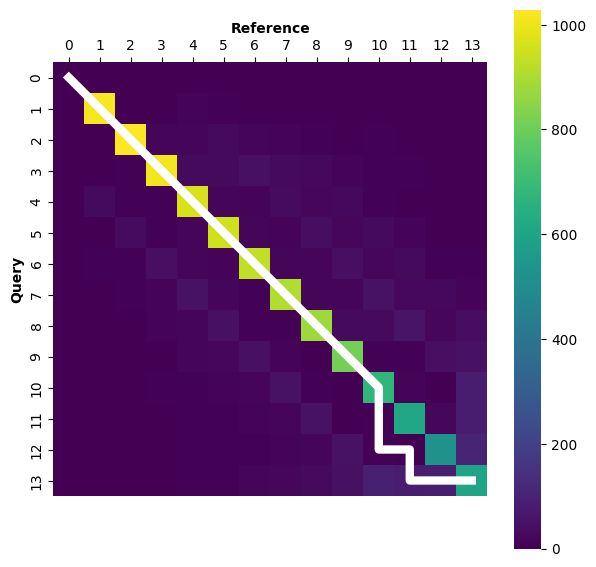

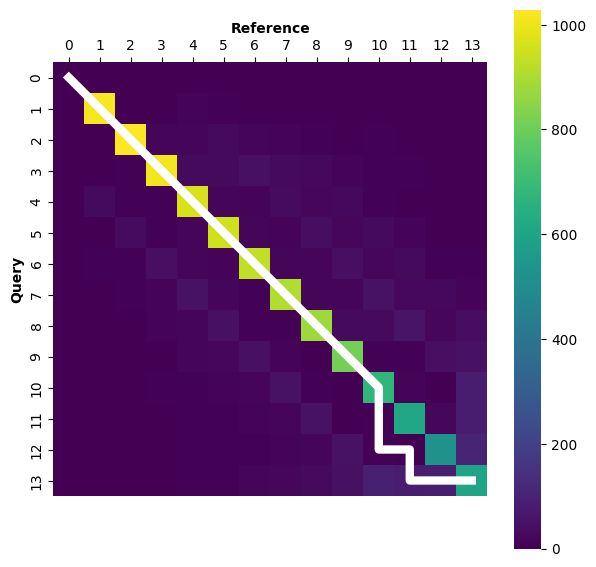

In [181]:
aligner.get_aggregate_alignment()


        
def plot_alignment_path_on_given_matrix(mat, paths, cmap='viridis'):
        fig,ax = plt.subplots(1,1, figsize=(7,7))
        sb.heatmap(mat, square=True,  cmap='viridis', ax=ax, cbar=True)  
        for path in paths: 
            path_x = [p[0]+0.5 for p in path]
            path_y = [p[1]+0.5 for p in path]
            ax.plot(path_y, path_x, color='white', linewidth=6)
        plt.xlabel("Reference",fontweight='bold')
        plt.ylabel("Query",fontweight='bold')
        ax.xaxis.tick_top() # x axis on top
        ax.xaxis.set_label_position('top')
        plt.savefig('attic/figures/G2G_average_alignment_TFs_RQ3.pdf')
        
average_alignment, alignment_path =  ClusterUtils.get_cluster_average_alignments(aligner, aligner.gene_list)
mat = ClusterUtils.get_pairwise_match_count_mat(aligner, aligner.gene_list )
print('Average Alignment: ', average_alignment)
plot_alignment_path_on_given_matrix(paths = [alignment_path], mat=mat)
        
        


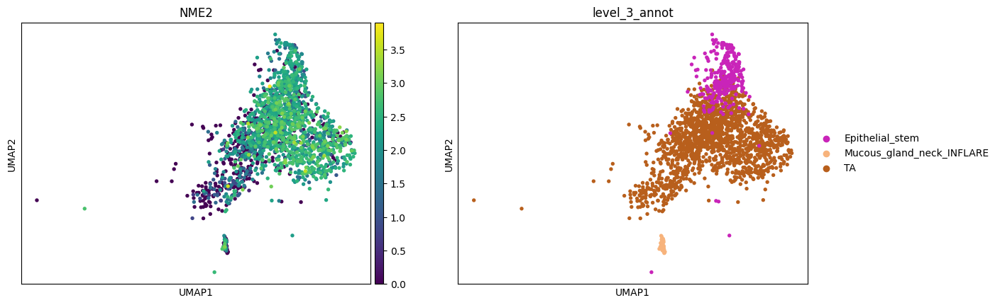

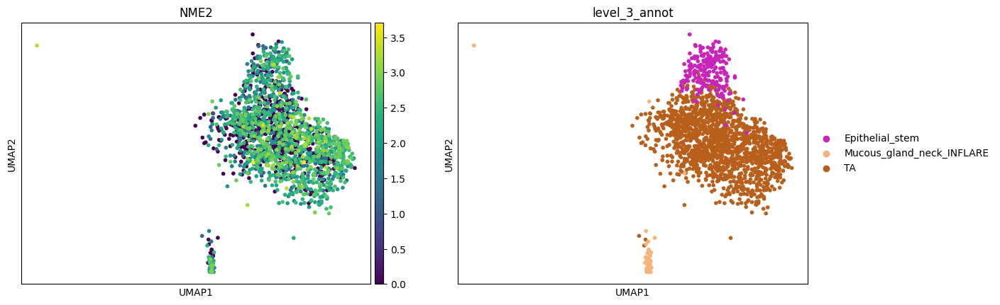

In [65]:
sc.pl.umap(adata_ref, color=['NME2','level_3_annot'])
sc.pl.umap(adata_query, color=['NME2','level_3_annot'])

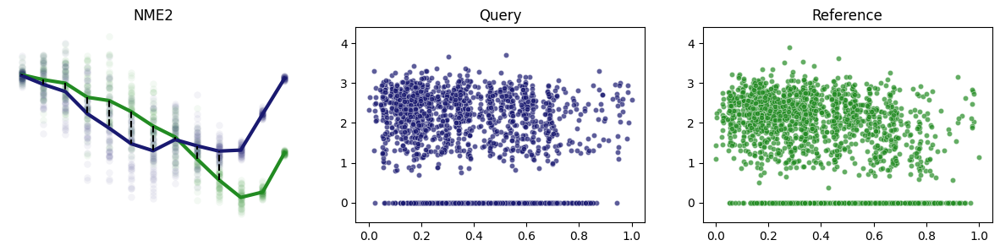

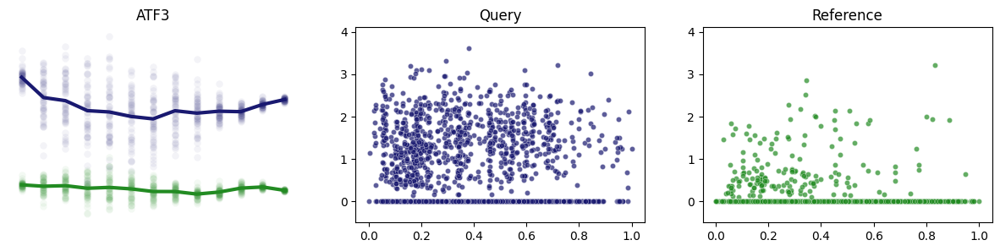

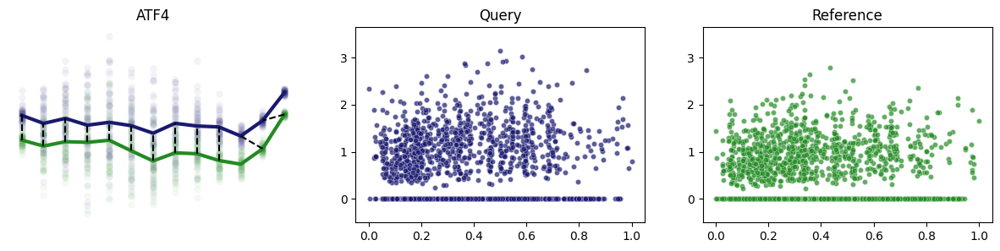

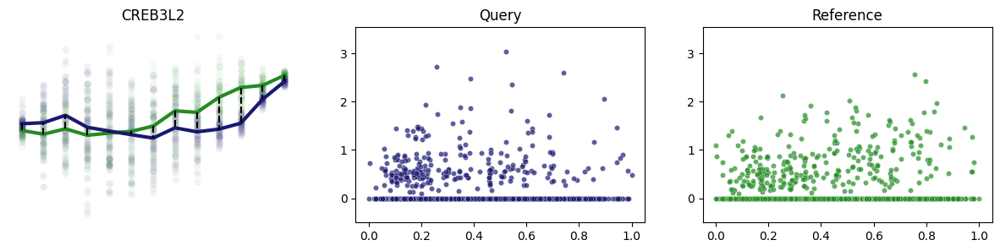

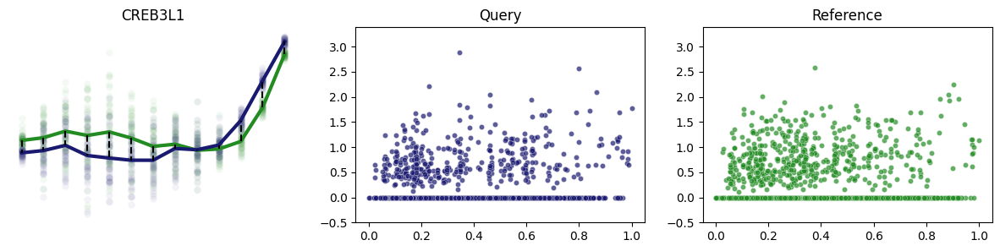

In [70]:
VisualUtils.plotTimeSeries('NME2', aligner)
VisualUtils.plotTimeSeries('ATF3', aligner)
VisualUtils.plotTimeSeries('ATF4', aligner)
VisualUtils.plotTimeSeries('CREB3L2', aligner)
VisualUtils.plotTimeSeries('CREB3L1', aligner)

In [56]:
df.sort_values('opt_alignment_cost', ascending=False)[0:20]

,Gene,alignment_similarity_percentage,opt_alignment_cost,l2fc,color,abs_l2fc
235,HOXB9,0.0,67.468115,-8.242246,red,8.242246
317,MEIS2,0.0,67.468115,4.11429,red,4.11429
234,HOXB7,0.0,67.468115,-6.622938,red,6.622938
626,ZBED6,0.0,67.468115,2.726508,red,2.726508
26,ATF3,0.0,67.468115,-3.348833,red,3.348833
629,ZBTB10,0.0,67.468115,-3.37552,red,3.37552
148,FOSB,0.0,67.468115,-1.781317,red,1.781317
227,HOXA10,0.0,67.468115,-5.192698,red,5.192698
419,PDX1,0.0,67.468115,5.330808,red,5.330808
232,HOXA5,0.0,67.468115,-5.501437,red,5.501437


mean matched percentage: 
75.68 %


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,-log10 Adjusted P-value,-log10 FDR q-val
0,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,10/200,4.644043e-15,9.752491e-14,0,0,86.789474,2864.329581,EGR1;JUN;MAFF;ZBTB10;FOSB;HES1;FOS;KLF4;JUNB;ATF3,13.010884,13.010884
1,MSigDB_Hallmark_2020,Hypoxia,5/200,2.181048e-06,2.290100e-05,0,0,29.838612,388.967355,JUN;HOXB9;MAFF;FOS;ATF3,4.640146,4.640146
21,KEGG_2021_Human,Amphetamine addiction,4/69,9.053511e-07,8.057625e-05,0,0,68.078632,947.310293,JUN;CREB3L3;FOSB;FOS,4.093793,4.093793
2,MSigDB_Hallmark_2020,UV Response Up,4/158,2.454656e-05,1.718259e-04,0,0,28.606061,303.651584,FOSB;FOS;JUNB;ATF3,3.764911,3.764911
22,KEGG_2021_Human,TNF signaling pathway,4/112,6.305860e-06,2.806108e-04,0,0,40.884774,489.555552,JUN;CREB3L3;FOS;JUNB,3.551896,3.551896
23,KEGG_2021_Human,Osteoclast differentiation,4/127,1.037991e-05,3.079372e-04,0,0,35.871725,411.650958,JUN;FOSB;FOS;JUNB,3.511538,3.511538
3,MSigDB_Hallmark_2020,p53 Pathway,4/200,6.163541e-05,3.235859e-04,0,0,22.428571,217.428717,JUN;FOS;KLF4;ATF3,3.490010,3.490010
24,KEGG_2021_Human,Cocaine addiction,3/49,2.059529e-05,4.582452e-04,0,0,68.416476,738.244439,JUN;CREB3L3;FOSB,3.338902,3.338902


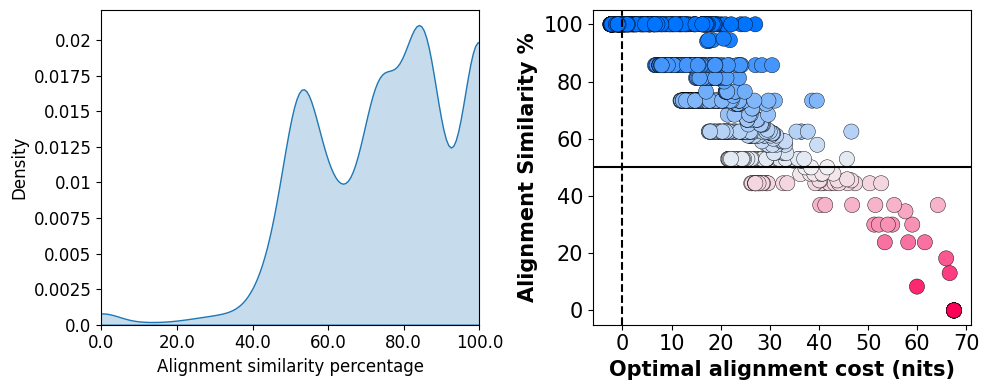

In [53]:
df = aligner.get_stat_df() 


topDEgenes = df[list(df['alignment_similarity_percentage'] <=0.3)]['Gene']
topDEgenes


pathway_df = PathwayAnalyserV2.run_overrepresentation_analysis(topDEgenes) # this is a wrapper function call for GSEAPy enrichr inferface
pathway_df[pathway_df['Adjusted P-value']<0.001] 


In [52]:
#aligner.show_ordered_alignments() 

MMMMIDIDIDIDIIIIIIDDDDDD
Optimal alignment cost: 59.601 nits
Alignment similarity percentage: 16.67 %


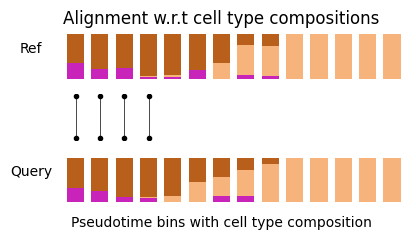

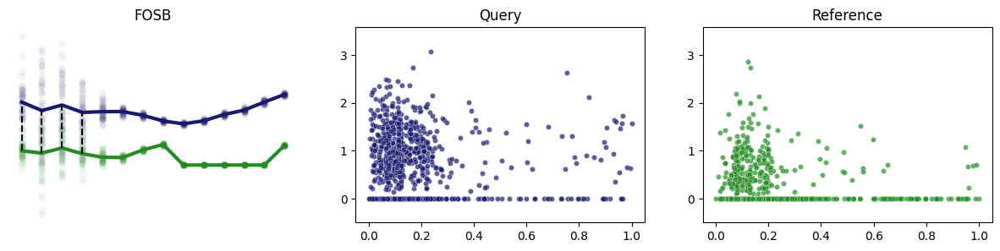

In [36]:


VisualUtils.show_gene_alignment('FOSB', aligner, vs, our_cmap)



mean matched percentage: 
81.58999999999999 %


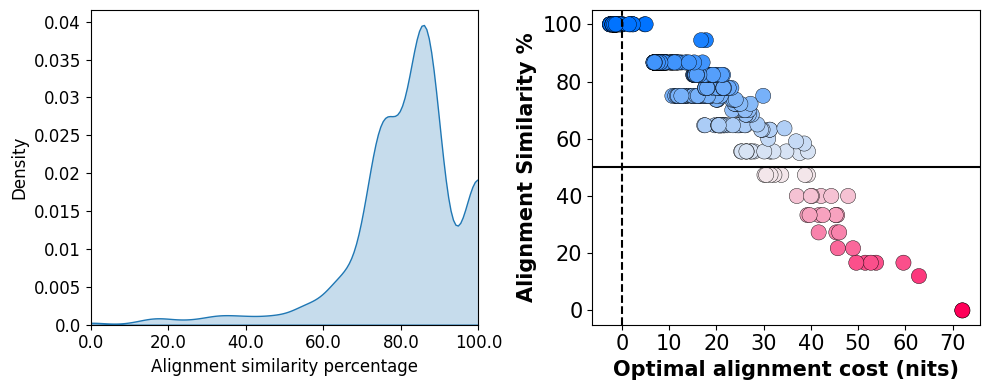

In [29]:
df = aligner.get_stat_df() 

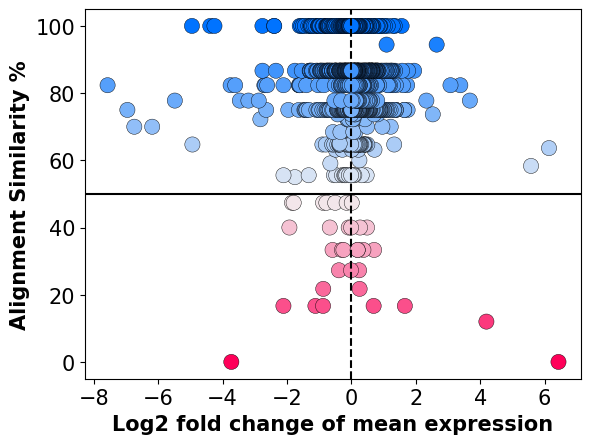

In [30]:
VisualUtils.plot_alignmentSim_vs_l2fc(df)

In [31]:


topDEgenes = df[list(df['alignment_similarity_percentage'] <=0.3)]['Gene']
topDEgenes



320    ONECUT2
22        ATF3
249      MEIS2
121       FOSB
270       MYRF
216       KLF6
120        FOS
279      NFAT5
313      NR4A1
175      HMGN3
23        ATF4
515     ZBTB7A
298       NME2
Name: Gene, dtype: object

In [32]:


pathway_df = PathwayAnalyserV2.run_overrepresentation_analysis(topDEgenes) # this is a wrapper function call for GSEAPy enrichr inferface
pathway_df[pathway_df['Adjusted P-value']<0.001] 



,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,-log10 Adjusted P-value,-log10 FDR q-val
0,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,6/200,1.501423e-09,1.801708e-08,0,0,87.450663,1776.722219,NFAT5;NR4A1;KLF6;FOSB;FOS;ATF3,7.744316,7.744316
1,MSigDB_Hallmark_2020,UV Response Up,4/158,2.536057e-06,1.521634e-05,0,0,57.238095,737.507130,NR4A1;FOSB;FOS;ATF3,4.817690,4.817690
12,KEGG_2021_Human,Amphetamine addiction,3/69,1.096451e-05,7.784800e-04,0,0,90.550000,1034.157712,FOSB;FOS;ATF4,3.108753,3.108753


In [35]:
for g in topDEgenes:
    print(g)

ONECUT2
ATF3
MEIS2
FOSB
MYRF
KLF6
FOS
NFAT5
NR4A1
HMGN3
ATF4
ZBTB7A
NME2


In [25]:
str("MMM").contains('M')

AttributeError: 'str' object has no attribute 'contains'

In [29]:
import regex as re
for a in aligner.results:
    if(a.alignment_str[0] in ['I','D'] and 'M' in a.alignment_str):
        
        result = re.search(r'[I*D*]+',  a.alignment_str)
        mismatch_len = result.span()[1]
        if(mismatch_len>=4):
            print(a.gene, a.alignment_str)
       # print(a.gene, a.alignment_str,mismatch_len)

BNC2 IDIDMMMMMMMMMMMM
ETS1 IIIIMMMMMMMMMMWWWW
ETV1 IIIIIIMMMMMMMMWWWWWW
GATA4 DDDDDDDMMMMMMVVVVVVVVD
HIVEP3 IDIDMMMMMMMMMMMM
HOXA9 IIIIIMMMMMMMMMWWWWW
HOXB3 IIIIIIMMMMMMMMWWWWWW
HOXB7 IIIIIIMMMMMMMMWWWWWW
IKZF1 IIIIMMMMMMMMMMWWWW
LBX2 IDIDMMMMMMMMMMMM
MITF IDIDMMMMMMMMMMMM
OSR2 IIIIMMMMMMMMMMWWWW
PDX1 DDDDDDDDDMMMMVVVVVVVVVVD
PITX2 IIIIMMMMMMMMMMWWWW
POU2F3 IDIDMMMMMMMMMMMM
SPDEF IIIIIIMMMMMMWWWWWWWIID
ZBTB16 DDDDDMMMMMMMMMVVVVV
ZNF483 IDIDMMMMMMMMMMMM
ZNF804A IDIDIDMMMMMMMMMMM


IIIIIIMMMMMMMMWWWWWW
Optimal alignment cost: 26.213 nits
Alignment similarity percentage: 70.0 %


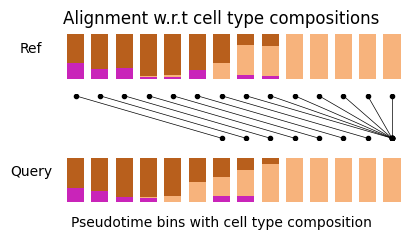

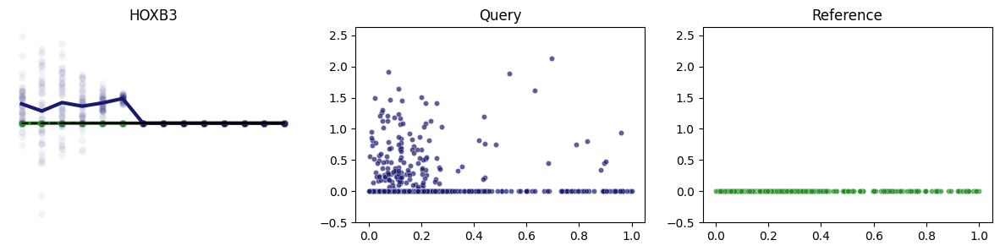

In [44]:

VisualUtils.show_gene_alignment('HOXB3', aligner, vs, our_cmap)

In [23]:
import pickle
with open('duo_healthy_ileum_disease_TF_aligner.pkl', 'rb') as f:
    aligner = pickle.load(f)


Average Alignment:  MMMMMMMMMMMMMM


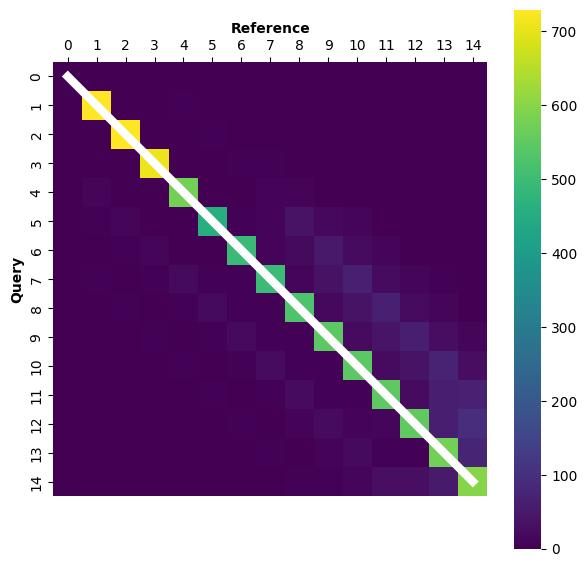

In [26]:

        
def plot_alignment_path_on_given_matrix(mat, paths, cmap='viridis'):
        fig,ax = plt.subplots(1,1, figsize=(7,7))
        sb.heatmap(mat, square=True,  cmap='viridis', ax=ax, cbar=True)  
        for path in paths: 
            path_x = [p[0]+0.5 for p in path]
            path_y = [p[1]+0.5 for p in path]
            ax.plot(path_y, path_x, color='white', linewidth=6)
        plt.xlabel("Reference",fontweight='bold')
        plt.ylabel("Query",fontweight='bold')
        ax.xaxis.tick_top() # x axis on top
        ax.xaxis.set_label_position('top')
        plt.savefig('G2G_average_alignment_TFs_RQ1.pdf')
        
average_alignment, alignment_path =  ClusterUtils.get_cluster_average_alignments(aligner, aligner.gene_list)
mat = ClusterUtils.get_pairwise_match_count_mat(aligner, aligner.gene_list )
print('Average Alignment: ', average_alignment)
plot_alignment_path_on_given_matrix(paths = [alignment_path], mat=mat)
        
        

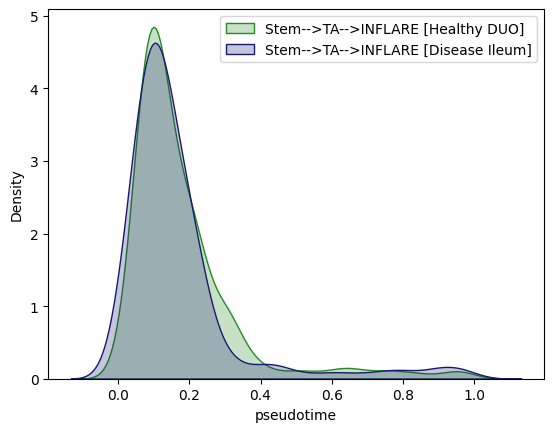

In [29]:
sb.kdeplot(adata_ref.obs['time'], fill=True, label='Stem-->TA-->INFLARE [Healthy DUO]', color='forestgreen') 
sb.kdeplot(adata_query.obs['time'], fill=True, label='Stem-->TA-->INFLARE [Disease Ileum]', color='midnightblue'); 
plt.xlabel('pseudotime'); plt.legend(); plt.savefig('figures/G2G_RQ1_pseudotime_distributions.pdf')

IIIDIDIDIDIIIIIIIIDDDDDDDDDD
Optimal alignment cost: 72.073 nits
Alignment similarity percentage: 0.0 %


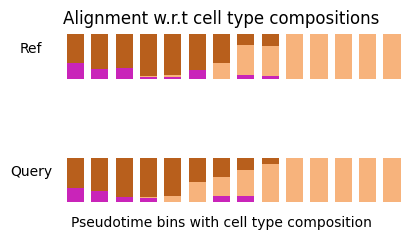

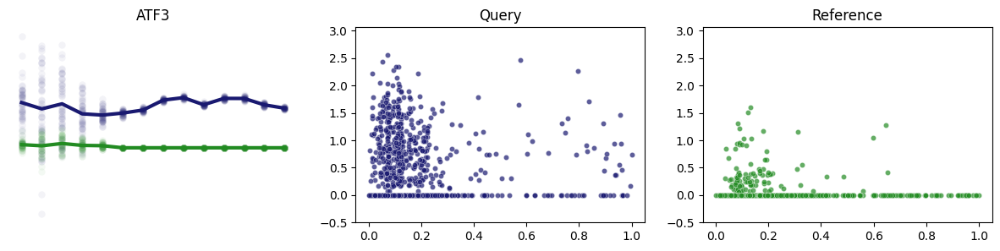

In [13]:
VisualUtils.show_gene_alignment('ATF3', aligner, vs, our_cmap)

In [16]:
aligner.show_ordered_alignments() 

Gene       Alignment
---------  ----------------------------
ATF3       IIIDIDIDIDIIIIIIIIDDDDDDDDDD
ONECUT2    IIIDIDIDIDIIIIIIIIDDDDDDDDDD
ARID3A     MMMMMMMMMMMMMM
ARID3B     MMMMMMMMMMMMMM
ARID5B     MMMMMMMMMMMMMM
ARNTL      MMMMMMMMMMMMMM
ATF5       MMMMMMMMMMMMMM
BACH2      MMMMMMMMMMMMMM
BATF2      MMMMMMMMMMMMMM
CDC5L      MMMMMMMMMMMMMM
CENPA      MMMMMMMMMMMMMM
CREB5      MMMMMMMMMMMMMM
CSRNP2     MMMMMMMMMMMMMM
CSRNP3     MMMMMMMMMMMMMM
CXXC1      MMMMMMMMMMMMMM
CXXC4      MMMMMMMMMMMMMM
DACH1      MMMMMMMMMMMMMM
E2F7       MMMMMMMMMMMMMM
EBF1       MMMMMMMMMMMMMM
ELF4       MMMMMMMMMMMMMM
ETV4       MMMMMMMMMMMMMM
ETV6       MMMMMMMMMMMMMM
ETV7       MMMMMMMMMMMMMM
FLYWCH1    MMMMMMMMMMMMMM
FOXM1      MMMMMMMMMMMMMM
FOXP2      MMMMMMMMMMMMMM
GABPA      MMMMMMMMMMMMMM
HMBOX1     MMMMMMMMMMMMMM
HMG20A     MMMMMMMMMMMMMM
HOXA3      MMMMMMMMMMMMMM
IKZF4      MMMMMMMMMMMMMM
JAZF1      MMMMMMMMMMMMMM
KAT7       MMMMMMMMMMMMMM
KLF10      MMMMMMMMMMMMMM
L3MBTL4    MMMMMMMMMMMMMM
L

22        ATF3
320    ONECUT2
10      ARID3A
11      ARID3B
13      ARID5B
        ...   
184      HOXB7
421      SPDEF
736    ZNF804A
139      GATA4
333       PDX1
Name: genes, Length: 764, dtype: object

[0.         0.07142857 0.14285714 0.21428571 0.28571429 0.35714286
 0.42857143 0.5        0.57142857 0.64285714 0.71428571 0.78571429
 0.85714286 0.92857143 1.        ]
[0.         0.07142857 0.14285714 0.21428571 0.28571429 0.35714286
 0.42857143 0.5        0.57142857 0.64285714 0.71428571 0.78571429
 0.85714286 0.92857143 1.        ]


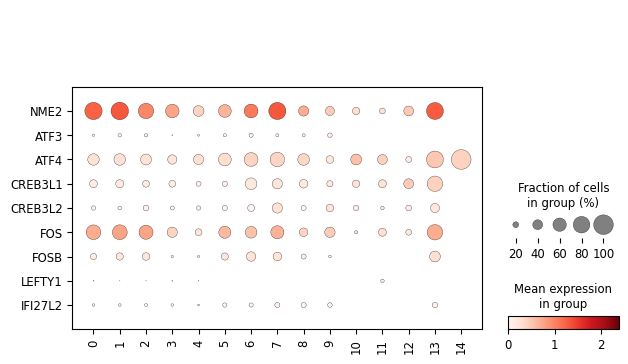

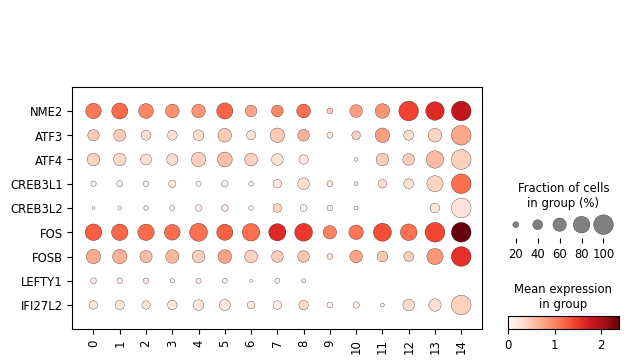

In [56]:
def pseudotime2bin_celltypes(adata, n_points):

            adata.obs['bin_ids'] = np.repeat(-1,adata.shape[0])

            bin_margins =  np.linspace(0,1,n_points)#[1:-1]
            print(bin_margins)
            #print('computed the margins for ' + str(len(bin_margins)) +  ' bins')
            #print(bin_margins)
            bin_ids = []
            k = 0 
            for i in range(len(bin_margins)):
                
                if(i==0):
                    logic = np.logical_and(adata.obs.time >= 0, adata.obs.time < bin_margins[i+1])
                    #print('i==0', adata[logic].shape[0])
                elif(i==len(bin_margins)-1):
                    logic =  np.logical_and(adata.obs.time >= bin_margins[i], adata.obs.time <= 1.0)
                else:
                    logic =  np.logical_and(adata.obs.time >= bin_margins[i], adata.obs.time < bin_margins[i+1])
                adata.obs['bin_ids'][logic] = i 
            return adata, bin_margins


pseudotime2bin_celltypes(adata_ref, 15)
pseudotime2bin_celltypes(adata_query, 15)
adata_ref.obs['bin_ids'] = [str(x) for x in adata_ref.obs.bin_ids]
adata_query.obs['bin_ids'] = [str(x) for x in adata_query.obs.bin_ids]

import scanpy as sc
genes = ['NME2','ATF3','ATF4','CREB3L1','CREB3L2','FOS','FOSB', 'LEFTY1','IFI27L2']
t = sc.pl.dotplot(adata_ref, genes, groupby='bin_ids', swap_axes=True, return_fig=True, show=False )
tr = max(t.dot_color_df.max()) 

t = sc.pl.dotplot(adata_query, genes, groupby='bin_ids', swap_axes=True, return_fig=True, show=False)
tq = max(t.dot_color_df.max()) 

t = max(tr,tq)
sc.pl.dotplot(adata_ref, genes, groupby='bin_ids', swap_axes=True, save='INFLARE_healthy_DUO.png', vmax=t)
sc.pl.dotplot(adata_query, genes, groupby='bin_ids', swap_axes=True,save='INFLARE_disease_Ilieum.png', vmax=t)

In [2]:
import pickle
with open('duo_healthy_ileum_disease_TF_aligner.pkl', 'rb') as f:
    aligner = pickle.load(f)

In [3]:
len(aligner.gene_list)

764

In [ ]:
VisualUtils.plotTimeSeries('NME2',aligner)

In [5]:
len(aligner.results_map['NME2'].S.time_points)

14